# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: qmnm9l1v
Name: driven-morning-623
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/qmnm9l1v
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_121054-qmnm9l1v/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 220,393,439,186,412,300,549,141,470,386,430,370,240,290,42,212,459,286,288,535,243,275,154,57,329,146,118,285,93,86,183,203,51,337,218,162,265,139,83,193,364,472,324,980,144,363,171,190,270,322,243,151,395,263,255,385,322,607,313,293,226,605,238,153,262,348,283,736,355,350,266,364,359,362,123,220,226,153,54,116,189,489,308,264,324,227,153,232,384,175,145,111,271,384,162,151,426,85,141,297,154,371,104,241,193,209,328,136,142,287,271,117,117,359,326,333,272,43,42,212,221,256,79,211,319,250,188,240,288,218,950,277,200,525,296,146,498,349,527,448,214,451,464,264,358,226,360,247,286,291,268,243,264,404,386,259,240,188,151,617,250,236,132,143,163,162,535,248,371,204,276,400,618,423,298,258,227,226,175,180,204,188,205,237,615,348,336,347,377,7143,439,275,199,162,372,180,261,279,165,32

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 56,88,119,46,83,79,138,34,112,77,103,94,61,68,17,52,103,79,60,128,63,60,34,7,81,38,16,79,33,21,47,42,13,75,68,49,66,41,31,44,104,94,91,239,35,112,44,51,85,76,42,27,75,65,74,93,65,180,69,73,64,126,59,30,60,77,71,169,86,95,58,95,92,83,36,64,51,38,17,35,58,141,74,81,102,45,39,63,95,41,30,19,58,110,30,49,126,11,52,71,61,92,22,62,44,65,82,31,41,81,78,23,24,86,101,111,55,11,17,54,57,73,17,43,76,61,49,58,73,45,247,60,41,122,79,46,125,83,99,133,47,120,115,74,93,74,84,55,77,75,71,59,55,96,111,54,58,49,41,153,60,57,44,43,52,40,132,67,109,65,69,112,132,90,74,64,57,65,43,42,60,48,50,68,148,86,76,99,86,1764,91,74,46,49,74,37,70,53,35,74,38,72,68,92,77,117,62,72,95,25,18,47,61,75,31,57,66,87,43,35,70,78,64,58,62,66,67,65,55,67,69,117,68,58,13,54,40,130,115,133,104,68,70,59,187,123,28,50,63

Epoch 1/1000:   0%|          | 1/1000 [00:13<3:38:47, 13.14s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:13<3:38:47, 13.14s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=100]

Epoch 2/1000:   0%|          | 1/1000 [00:13<3:38:47, 13.14s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=100]

Epoch 2/1000:   0%|          | 2/1000 [00:19<2:34:58,  9.32s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=100]

Epoch 2/1000:   0%|          | 2/1000 [00:19<2:34:58,  9.32s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=51.5]

Epoch 3/1000:   0%|          | 2/1000 [00:19<2:34:58,  9.32s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=51.5]

Epoch 3/1000:   0%|          | 3/1000 [00:26<2:13:57,  8.06s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=51.5]

Epoch 3/1000:   0%|          | 3/1000 [00:26<2:13:57,  8.06s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=4.57]

Epoch 4/1000:   0%|          | 3/1000 [00:26<2:13:57,  8.06s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=4.57]

Epoch 4/1000:   0%|          | 4/1000 [00:32<2:04:03,  7.47s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=4.57]

Epoch 4/1000:   0%|          | 4/1000 [00:32<2:04:03,  7.47s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=1.72]

Epoch 5/1000:   0%|          | 4/1000 [00:32<2:04:03,  7.47s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=1.72]

Epoch 5/1000:   0%|          | 5/1000 [00:39<1:58:39,  7.16s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=1.72]

Epoch 5/1000:   0%|          | 5/1000 [00:39<1:58:39,  7.16s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=7.82]

Epoch 6/1000:   0%|          | 5/1000 [00:39<1:58:39,  7.16s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=7.82]

Epoch 6/1000:   1%|          | 6/1000 [00:46<1:55:27,  6.97s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=7.82]

Epoch 6/1000:   1%|          | 6/1000 [00:46<1:55:27,  6.97s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=25.2]

Epoch 7/1000:   1%|          | 6/1000 [00:46<1:55:27,  6.97s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=25.2]

Epoch 7/1000:   1%|          | 7/1000 [00:52<1:53:06,  6.83s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=25.2]

Epoch 7/1000:   1%|          | 7/1000 [00:52<1:53:06,  6.83s/it, v_num=1v_1, total_loss_train=1.24e+3, kl_local_train=26.8]

Epoch 8/1000:   1%|          | 7/1000 [00:52<1:53:06,  6.83s/it, v_num=1v_1, total_loss_train=1.24e+3, kl_local_train=26.8]

Epoch 8/1000:   1%|          | 8/1000 [00:59<1:51:31,  6.75s/it, v_num=1v_1, total_loss_train=1.24e+3, kl_local_train=26.8]

Epoch 8/1000:   1%|          | 8/1000 [00:59<1:51:31,  6.75s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=25.3]

Epoch 9/1000:   1%|          | 8/1000 [00:59<1:51:31,  6.75s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=25.3]

Epoch 9/1000:   1%|          | 9/1000 [01:05<1:50:34,  6.69s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=25.3]

Epoch 9/1000:   1%|          | 9/1000 [01:05<1:50:34,  6.69s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=31.4]

Epoch 10/1000:   1%|          | 9/1000 [01:05<1:50:34,  6.69s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=31.4]

Epoch 10/1000:   1%|          | 10/1000 [01:12<1:49:49,  6.66s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=31.4]

Epoch 10/1000:   1%|          | 10/1000 [01:12<1:49:49,  6.66s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=31.9] 

Epoch 11/1000:   1%|          | 10/1000 [01:12<1:49:49,  6.66s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=31.9]

Epoch 11/1000:   1%|          | 11/1000 [01:18<1:49:23,  6.64s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=31.9]

Epoch 11/1000:   1%|          | 11/1000 [01:18<1:49:23,  6.64s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=32.2]

Epoch 12/1000:   1%|          | 11/1000 [01:18<1:49:23,  6.64s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=32.2]

Epoch 12/1000:   1%|          | 12/1000 [01:25<1:48:49,  6.61s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=32.2]

Epoch 12/1000:   1%|          | 12/1000 [01:25<1:48:49,  6.61s/it, v_num=1v_1, total_loss_train=1.19e+3, kl_local_train=33.1]

Epoch 13/1000:   1%|          | 12/1000 [01:25<1:48:49,  6.61s/it, v_num=1v_1, total_loss_train=1.19e+3, kl_local_train=33.1]

Epoch 13/1000:   1%|▏         | 13/1000 [01:32<1:48:22,  6.59s/it, v_num=1v_1, total_loss_train=1.19e+3, kl_local_train=33.1]

Epoch 13/1000:   1%|▏         | 13/1000 [01:32<1:48:22,  6.59s/it, v_num=1v_1, total_loss_train=1.18e+3, kl_local_train=33.8]

Epoch 14/1000:   1%|▏         | 13/1000 [01:32<1:48:22,  6.59s/it, v_num=1v_1, total_loss_train=1.18e+3, kl_local_train=33.8]

Epoch 14/1000:   1%|▏         | 14/1000 [01:38<1:48:11,  6.58s/it, v_num=1v_1, total_loss_train=1.18e+3, kl_local_train=33.8]

Epoch 14/1000:   1%|▏         | 14/1000 [01:38<1:48:11,  6.58s/it, v_num=1v_1, total_loss_train=1.19e+3, kl_local_train=45.1]

Epoch 15/1000:   1%|▏         | 14/1000 [01:38<1:48:11,  6.58s/it, v_num=1v_1, total_loss_train=1.19e+3, kl_local_train=45.1]

Epoch 15/1000:   2%|▏         | 15/1000 [01:45<1:47:57,  6.58s/it, v_num=1v_1, total_loss_train=1.19e+3, kl_local_train=45.1]

Epoch 15/1000:   2%|▏         | 15/1000 [01:45<1:47:57,  6.58s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=64.6] 

Epoch 16/1000:   2%|▏         | 15/1000 [01:45<1:47:57,  6.58s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=64.6]

Epoch 16/1000:   2%|▏         | 16/1000 [01:51<1:47:46,  6.57s/it, v_num=1v_1, total_loss_train=1.2e+3, kl_local_train=64.6]

Epoch 16/1000:   2%|▏         | 16/1000 [01:51<1:47:46,  6.57s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=77] 

Epoch 17/1000:   2%|▏         | 16/1000 [01:51<1:47:46,  6.57s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=77]

Epoch 17/1000:   2%|▏         | 17/1000 [01:58<1:47:29,  6.56s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=77]

Epoch 17/1000:   2%|▏         | 17/1000 [01:58<1:47:29,  6.56s/it, v_num=1v_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 18/1000:   2%|▏         | 17/1000 [01:58<1:47:29,  6.56s/it, v_num=1v_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 18/1000:   2%|▏         | 18/1000 [02:04<1:47:20,  6.56s/it, v_num=1v_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 18/1000:   2%|▏         | 18/1000 [02:04<1:47:20,  6.56s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=104] 

Epoch 19/1000:   2%|▏         | 18/1000 [02:04<1:47:20,  6.56s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=104]

Epoch 19/1000:   2%|▏         | 19/1000 [02:11<1:47:13,  6.56s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=104]

Epoch 19/1000:   2%|▏         | 19/1000 [02:11<1:47:13,  6.56s/it, v_num=1v_1, total_loss_train=1.24e+3, kl_local_train=123]

Epoch 20/1000:   2%|▏         | 19/1000 [02:11<1:47:13,  6.56s/it, v_num=1v_1, total_loss_train=1.24e+3, kl_local_train=123]

Epoch 20/1000:   2%|▏         | 20/1000 [02:17<1:47:04,  6.56s/it, v_num=1v_1, total_loss_train=1.24e+3, kl_local_train=123]

Epoch 20/1000:   2%|▏         | 20/1000 [02:17<1:47:04,  6.56s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=140]

Epoch 21/1000:   2%|▏         | 20/1000 [02:17<1:47:04,  6.56s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=140]

Epoch 21/1000:   2%|▏         | 21/1000 [02:24<1:46:54,  6.55s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=140]

Epoch 21/1000:   2%|▏         | 21/1000 [02:24<1:46:54,  6.55s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=136]

Epoch 22/1000:   2%|▏         | 21/1000 [02:24<1:46:54,  6.55s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=136]

Epoch 22/1000:   2%|▏         | 22/1000 [02:31<1:46:50,  6.55s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=136]

Epoch 22/1000:   2%|▏         | 22/1000 [02:31<1:46:50,  6.55s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=151]

Epoch 23/1000:   2%|▏         | 22/1000 [02:31<1:46:50,  6.55s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=151]

Epoch 23/1000:   2%|▏         | 23/1000 [02:37<1:46:45,  6.56s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=151]

Epoch 23/1000:   2%|▏         | 23/1000 [02:37<1:46:45,  6.56s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=132]

Epoch 24/1000:   2%|▏         | 23/1000 [02:37<1:46:45,  6.56s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=132]

Epoch 24/1000:   2%|▏         | 24/1000 [02:44<1:46:29,  6.55s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=132]

Epoch 24/1000:   2%|▏         | 24/1000 [02:44<1:46:29,  6.55s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=144]

Epoch 25/1000:   2%|▏         | 24/1000 [02:44<1:46:29,  6.55s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=144]

Epoch 25/1000:   2%|▎         | 25/1000 [02:50<1:46:53,  6.58s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=144]

Epoch 25/1000:   2%|▎         | 25/1000 [02:50<1:46:53,  6.58s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=153]

Epoch 26/1000:   2%|▎         | 25/1000 [02:50<1:46:53,  6.58s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=153]

Epoch 26/1000:   3%|▎         | 26/1000 [02:57<1:46:27,  6.56s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=153]

Epoch 26/1000:   3%|▎         | 26/1000 [02:57<1:46:27,  6.56s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=169] 

Epoch 27/1000:   3%|▎         | 26/1000 [02:57<1:46:27,  6.56s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=169]

Epoch 27/1000:   3%|▎         | 27/1000 [03:03<1:46:11,  6.55s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=169]

Epoch 27/1000:   3%|▎         | 27/1000 [03:03<1:46:11,  6.55s/it, v_num=1v_1, total_loss_train=1.31e+3, kl_local_train=160]

Epoch 28/1000:   3%|▎         | 27/1000 [03:03<1:46:11,  6.55s/it, v_num=1v_1, total_loss_train=1.31e+3, kl_local_train=160]

Epoch 28/1000:   3%|▎         | 28/1000 [03:10<1:46:12,  6.56s/it, v_num=1v_1, total_loss_train=1.31e+3, kl_local_train=160]

Epoch 28/1000:   3%|▎         | 28/1000 [03:10<1:46:12,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=163]

Epoch 29/1000:   3%|▎         | 28/1000 [03:10<1:46:12,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=163]

Epoch 29/1000:   3%|▎         | 29/1000 [03:17<1:46:23,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=163]

Epoch 29/1000:   3%|▎         | 29/1000 [03:17<1:46:23,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=170]

Epoch 30/1000:   3%|▎         | 29/1000 [03:17<1:46:23,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=170]

Epoch 30/1000:   3%|▎         | 30/1000 [03:23<1:46:18,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=170]

Epoch 30/1000:   3%|▎         | 30/1000 [03:23<1:46:18,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=157]

Epoch 31/1000:   3%|▎         | 30/1000 [03:23<1:46:18,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=157]

Epoch 31/1000:   3%|▎         | 31/1000 [03:30<1:45:58,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=157]

Epoch 31/1000:   3%|▎         | 31/1000 [03:30<1:45:58,  6.56s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=172]

Epoch 32/1000:   3%|▎         | 31/1000 [03:30<1:45:58,  6.56s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=172]

Epoch 32/1000:   3%|▎         | 32/1000 [03:36<1:45:48,  6.56s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=172]

Epoch 32/1000:   3%|▎         | 32/1000 [03:36<1:45:48,  6.56s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=184]

Epoch 33/1000:   3%|▎         | 32/1000 [03:36<1:45:48,  6.56s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=184]

Epoch 33/1000:   3%|▎         | 33/1000 [03:43<1:45:48,  6.57s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=184]

Epoch 33/1000:   3%|▎         | 33/1000 [03:43<1:45:48,  6.57s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=163]

Epoch 34/1000:   3%|▎         | 33/1000 [03:43<1:45:48,  6.57s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=163]

Epoch 34/1000:   3%|▎         | 34/1000 [03:49<1:45:37,  6.56s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=163]

Epoch 34/1000:   3%|▎         | 34/1000 [03:49<1:45:37,  6.56s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=185]

Epoch 35/1000:   3%|▎         | 34/1000 [03:49<1:45:37,  6.56s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=185]

Epoch 35/1000:   4%|▎         | 35/1000 [03:56<1:45:30,  6.56s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=185]

Epoch 35/1000:   4%|▎         | 35/1000 [03:56<1:45:30,  6.56s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=156] 

Epoch 36/1000:   4%|▎         | 35/1000 [03:56<1:45:30,  6.56s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=156]

Epoch 36/1000:   4%|▎         | 36/1000 [04:02<1:45:15,  6.55s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=156]

Epoch 36/1000:   4%|▎         | 36/1000 [04:02<1:45:15,  6.55s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=149]

Epoch 37/1000:   4%|▎         | 36/1000 [04:02<1:45:15,  6.55s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=149]

Epoch 37/1000:   4%|▎         | 37/1000 [04:09<1:45:17,  6.56s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=149]

Epoch 37/1000:   4%|▎         | 37/1000 [04:09<1:45:17,  6.56s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=149]

Epoch 38/1000:   4%|▎         | 37/1000 [04:09<1:45:17,  6.56s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=149]

Epoch 38/1000:   4%|▍         | 38/1000 [04:16<1:45:27,  6.58s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=149]

Epoch 38/1000:   4%|▍         | 38/1000 [04:16<1:45:27,  6.58s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=157]

Epoch 39/1000:   4%|▍         | 38/1000 [04:16<1:45:27,  6.58s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=157]

Epoch 39/1000:   4%|▍         | 39/1000 [04:22<1:45:25,  6.58s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=157]

Epoch 39/1000:   4%|▍         | 39/1000 [04:22<1:45:25,  6.58s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=183]

Epoch 40/1000:   4%|▍         | 39/1000 [04:22<1:45:25,  6.58s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=183]

Epoch 40/1000:   4%|▍         | 40/1000 [04:29<1:45:19,  6.58s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=183]

Epoch 40/1000:   4%|▍         | 40/1000 [04:29<1:45:19,  6.58s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=141]

Epoch 41/1000:   4%|▍         | 40/1000 [04:29<1:45:19,  6.58s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=141]

Epoch 41/1000:   4%|▍         | 41/1000 [04:35<1:45:30,  6.60s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=141]

Epoch 41/1000:   4%|▍         | 41/1000 [04:35<1:45:30,  6.60s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=165]

Epoch 42/1000:   4%|▍         | 41/1000 [04:35<1:45:30,  6.60s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=165]

Epoch 42/1000:   4%|▍         | 42/1000 [04:42<1:45:22,  6.60s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=165]

Epoch 42/1000:   4%|▍         | 42/1000 [04:42<1:45:22,  6.60s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=190]

Epoch 43/1000:   4%|▍         | 42/1000 [04:42<1:45:22,  6.60s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=190]

Epoch 43/1000:   4%|▍         | 43/1000 [04:49<1:45:38,  6.62s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=190]

Epoch 43/1000:   4%|▍         | 43/1000 [04:49<1:45:38,  6.62s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 44/1000:   4%|▍         | 43/1000 [04:49<1:45:38,  6.62s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 44/1000:   4%|▍         | 44/1000 [04:55<1:45:16,  6.61s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 44/1000:   4%|▍         | 44/1000 [04:55<1:45:16,  6.61s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=158]

Epoch 45/1000:   4%|▍         | 44/1000 [04:55<1:45:16,  6.61s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=158]

Epoch 45/1000:   4%|▍         | 45/1000 [05:02<1:45:01,  6.60s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=158]

Epoch 45/1000:   4%|▍         | 45/1000 [05:02<1:45:01,  6.60s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=184]

Epoch 46/1000:   4%|▍         | 45/1000 [05:02<1:45:01,  6.60s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=184]

Epoch 46/1000:   5%|▍         | 46/1000 [05:08<1:45:08,  6.61s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=184]

Epoch 46/1000:   5%|▍         | 46/1000 [05:08<1:45:08,  6.61s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=195]

Epoch 47/1000:   5%|▍         | 46/1000 [05:09<1:45:08,  6.61s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=195]

Epoch 47/1000:   5%|▍         | 47/1000 [05:15<1:45:53,  6.67s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=195]

Epoch 47/1000:   5%|▍         | 47/1000 [05:15<1:45:53,  6.67s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=192]

Epoch 48/1000:   5%|▍         | 47/1000 [05:15<1:45:53,  6.67s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=192]

Epoch 48/1000:   5%|▍         | 48/1000 [05:22<1:45:43,  6.66s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=192]

Epoch 48/1000:   5%|▍         | 48/1000 [05:22<1:45:43,  6.66s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=193]

Epoch 49/1000:   5%|▍         | 48/1000 [05:22<1:45:43,  6.66s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=193]

Epoch 49/1000:   5%|▍         | 49/1000 [05:29<1:45:22,  6.65s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=193]

Epoch 49/1000:   5%|▍         | 49/1000 [05:29<1:45:22,  6.65s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=171]

Epoch 50/1000:   5%|▍         | 49/1000 [05:29<1:45:22,  6.65s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=171]

Epoch 50/1000:   5%|▌         | 50/1000 [05:35<1:45:01,  6.63s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=171]

Epoch 50/1000:   5%|▌         | 50/1000 [05:35<1:45:01,  6.63s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=155]

Epoch 51/1000:   5%|▌         | 50/1000 [05:35<1:45:01,  6.63s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=155]

Epoch 51/1000:   5%|▌         | 51/1000 [05:42<1:44:44,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=155]

Epoch 51/1000:   5%|▌         | 51/1000 [05:42<1:44:44,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=148]

Epoch 52/1000:   5%|▌         | 51/1000 [05:42<1:44:44,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=148]

Epoch 52/1000:   5%|▌         | 52/1000 [05:48<1:44:47,  6.63s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=148]

Epoch 52/1000:   5%|▌         | 52/1000 [05:48<1:44:47,  6.63s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=169]

Epoch 53/1000:   5%|▌         | 52/1000 [05:48<1:44:47,  6.63s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=169]

Epoch 53/1000:   5%|▌         | 53/1000 [05:55<1:44:29,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=169]

Epoch 53/1000:   5%|▌         | 53/1000 [05:55<1:44:29,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=177]

Epoch 54/1000:   5%|▌         | 53/1000 [05:55<1:44:29,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=177]

Epoch 54/1000:   5%|▌         | 54/1000 [06:02<1:44:12,  6.61s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=177]

Epoch 54/1000:   5%|▌         | 54/1000 [06:02<1:44:12,  6.61s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=178]

Epoch 55/1000:   5%|▌         | 54/1000 [06:02<1:44:12,  6.61s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=178]

Epoch 55/1000:   6%|▌         | 55/1000 [06:08<1:44:11,  6.62s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=178]

Epoch 55/1000:   6%|▌         | 55/1000 [06:08<1:44:11,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=188]

Epoch 56/1000:   6%|▌         | 55/1000 [06:08<1:44:11,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=188]

Epoch 56/1000:   6%|▌         | 56/1000 [06:15<1:44:10,  6.62s/it, v_num=1v_1, total_loss_train=1.55e+3, kl_local_train=188]

Epoch 56/1000:   6%|▌         | 56/1000 [06:15<1:44:10,  6.62s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=184]

Epoch 57/1000:   6%|▌         | 56/1000 [06:15<1:44:10,  6.62s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=184]

Epoch 57/1000:   6%|▌         | 57/1000 [06:21<1:43:56,  6.61s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=184]

Epoch 57/1000:   6%|▌         | 57/1000 [06:21<1:43:56,  6.61s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=181]

Epoch 58/1000:   6%|▌         | 57/1000 [06:21<1:43:56,  6.61s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=181]

Epoch 58/1000:   6%|▌         | 58/1000 [06:28<1:43:41,  6.60s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=181]

Epoch 58/1000:   6%|▌         | 58/1000 [06:28<1:43:41,  6.60s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=165]

Epoch 59/1000:   6%|▌         | 58/1000 [06:28<1:43:41,  6.60s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=165]

Epoch 59/1000:   6%|▌         | 59/1000 [06:35<1:43:36,  6.61s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=165]

Epoch 59/1000:   6%|▌         | 59/1000 [06:35<1:43:36,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=161]

Epoch 60/1000:   6%|▌         | 59/1000 [06:35<1:43:36,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=161]

Epoch 60/1000:   6%|▌         | 60/1000 [06:41<1:43:27,  6.60s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=161]

Epoch 60/1000:   6%|▌         | 60/1000 [06:41<1:43:27,  6.60s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=141]

Epoch 61/1000:   6%|▌         | 60/1000 [06:41<1:43:27,  6.60s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=141]

Epoch 61/1000:   6%|▌         | 61/1000 [06:48<1:43:17,  6.60s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=141]

Epoch 61/1000:   6%|▌         | 61/1000 [06:48<1:43:17,  6.60s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=149]

Epoch 62/1000:   6%|▌         | 61/1000 [06:48<1:43:17,  6.60s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=149]

Epoch 62/1000:   6%|▌         | 62/1000 [06:54<1:43:16,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=149]

Epoch 62/1000:   6%|▌         | 62/1000 [06:54<1:43:16,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=152]

Epoch 63/1000:   6%|▌         | 62/1000 [06:54<1:43:16,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=152]

Epoch 63/1000:   6%|▋         | 63/1000 [07:01<1:43:12,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=152]

Epoch 63/1000:   6%|▋         | 63/1000 [07:01<1:43:12,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=150]

Epoch 64/1000:   6%|▋         | 63/1000 [07:01<1:43:12,  6.61s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=150]

Epoch 64/1000:   6%|▋         | 64/1000 [07:08<1:43:27,  6.63s/it, v_num=1v_1, total_loss_train=1.53e+3, kl_local_train=150]

Epoch 64/1000:   6%|▋         | 64/1000 [07:08<1:43:27,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=138]

Epoch 65/1000:   6%|▋         | 64/1000 [07:08<1:43:27,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=138]

Epoch 65/1000:   6%|▋         | 65/1000 [07:14<1:43:16,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=138]

Epoch 65/1000:   6%|▋         | 65/1000 [07:14<1:43:16,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=141]

Epoch 66/1000:   6%|▋         | 65/1000 [07:14<1:43:16,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=141]

Epoch 66/1000:   7%|▋         | 66/1000 [07:21<1:42:49,  6.61s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=141]

Epoch 66/1000:   7%|▋         | 66/1000 [07:21<1:42:49,  6.61s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=137]

Epoch 67/1000:   7%|▋         | 66/1000 [07:21<1:42:49,  6.61s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=137]

Epoch 67/1000:   7%|▋         | 67/1000 [07:28<1:42:51,  6.62s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=137]

Epoch 67/1000:   7%|▋         | 67/1000 [07:28<1:42:51,  6.62s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=152]

Epoch 68/1000:   7%|▋         | 67/1000 [07:28<1:42:51,  6.62s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=152]

Epoch 68/1000:   7%|▋         | 68/1000 [07:34<1:42:54,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=152]

Epoch 68/1000:   7%|▋         | 68/1000 [07:34<1:42:54,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=145]

Epoch 69/1000:   7%|▋         | 68/1000 [07:34<1:42:54,  6.63s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=145]

Epoch 69/1000:   7%|▋         | 69/1000 [07:41<1:42:23,  6.60s/it, v_num=1v_1, total_loss_train=1.52e+3, kl_local_train=145]

Epoch 69/1000:   7%|▋         | 69/1000 [07:41<1:42:23,  6.60s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=125]

Epoch 70/1000:   7%|▋         | 69/1000 [07:41<1:42:23,  6.60s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=125]

Epoch 70/1000:   7%|▋         | 70/1000 [07:47<1:41:58,  6.58s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=125]

Epoch 70/1000:   7%|▋         | 70/1000 [07:47<1:41:58,  6.58s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=126]

Epoch 71/1000:   7%|▋         | 70/1000 [07:47<1:41:58,  6.58s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=126]

Epoch 71/1000:   7%|▋         | 71/1000 [07:54<1:41:33,  6.56s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=126]

Epoch 71/1000:   7%|▋         | 71/1000 [07:54<1:41:33,  6.56s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=140]

Epoch 72/1000:   7%|▋         | 71/1000 [07:54<1:41:33,  6.56s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=140]

Epoch 72/1000:   7%|▋         | 72/1000 [08:00<1:41:16,  6.55s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=140]

Epoch 72/1000:   7%|▋         | 72/1000 [08:00<1:41:16,  6.55s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=114]

Epoch 73/1000:   7%|▋         | 72/1000 [08:00<1:41:16,  6.55s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=114]

Epoch 73/1000:   7%|▋         | 73/1000 [08:07<1:40:54,  6.53s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=114]

Epoch 73/1000:   7%|▋         | 73/1000 [08:07<1:40:54,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=105] 

Epoch 74/1000:   7%|▋         | 73/1000 [08:07<1:40:54,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=105]

Epoch 74/1000:   7%|▋         | 74/1000 [08:13<1:40:47,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=105]

Epoch 74/1000:   7%|▋         | 74/1000 [08:13<1:40:47,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=118]

Epoch 75/1000:   7%|▋         | 74/1000 [08:13<1:40:47,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=118]

Epoch 75/1000:   8%|▊         | 75/1000 [08:20<1:40:54,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=118]

Epoch 75/1000:   8%|▊         | 75/1000 [08:20<1:40:54,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=110]

Epoch 76/1000:   8%|▊         | 75/1000 [08:20<1:40:54,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=110]

Epoch 76/1000:   8%|▊         | 76/1000 [08:26<1:40:37,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=110]

Epoch 76/1000:   8%|▊         | 76/1000 [08:26<1:40:37,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=127]

Epoch 77/1000:   8%|▊         | 76/1000 [08:26<1:40:37,  6.53s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=127]

Epoch 77/1000:   8%|▊         | 77/1000 [08:33<1:40:33,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=127]

Epoch 77/1000:   8%|▊         | 77/1000 [08:33<1:40:33,  6.54s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=114]

Epoch 78/1000:   8%|▊         | 77/1000 [08:33<1:40:33,  6.54s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=114]

Epoch 78/1000:   8%|▊         | 78/1000 [08:39<1:40:26,  6.54s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=114]

Epoch 78/1000:   8%|▊         | 78/1000 [08:39<1:40:26,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=123] 

Epoch 79/1000:   8%|▊         | 78/1000 [08:40<1:40:26,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=123]

Epoch 79/1000:   8%|▊         | 79/1000 [08:46<1:40:20,  6.54s/it, v_num=1v_1, total_loss_train=1.5e+3, kl_local_train=123]

Epoch 79/1000:   8%|▊         | 79/1000 [08:46<1:40:20,  6.54s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=116]

Epoch 80/1000:   8%|▊         | 79/1000 [08:46<1:40:20,  6.54s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=116]

Epoch 80/1000:   8%|▊         | 80/1000 [08:53<1:40:12,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=116]

Epoch 80/1000:   8%|▊         | 80/1000 [08:53<1:40:12,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=115]

Epoch 81/1000:   8%|▊         | 80/1000 [08:53<1:40:12,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=115]

Epoch 81/1000:   8%|▊         | 81/1000 [08:59<1:39:59,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=115]

Epoch 81/1000:   8%|▊         | 81/1000 [08:59<1:39:59,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=109]

Epoch 82/1000:   8%|▊         | 81/1000 [08:59<1:39:59,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=109]

Epoch 82/1000:   8%|▊         | 82/1000 [09:06<1:39:52,  6.53s/it, v_num=1v_1, total_loss_train=1.49e+3, kl_local_train=109]

Epoch 82/1000:   8%|▊         | 82/1000 [09:06<1:39:52,  6.53s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=96.7]

Epoch 83/1000:   8%|▊         | 82/1000 [09:06<1:39:52,  6.53s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=96.7]

Epoch 83/1000:   8%|▊         | 83/1000 [09:12<1:39:51,  6.53s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=96.7]

Epoch 83/1000:   8%|▊         | 83/1000 [09:12<1:39:51,  6.53s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=103] 

Epoch 84/1000:   8%|▊         | 83/1000 [09:12<1:39:51,  6.53s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=103]

Epoch 84/1000:   8%|▊         | 84/1000 [09:19<1:40:03,  6.55s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=103]

Epoch 84/1000:   8%|▊         | 84/1000 [09:19<1:40:03,  6.55s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=104]

Epoch 85/1000:   8%|▊         | 84/1000 [09:19<1:40:03,  6.55s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=104]

Epoch 85/1000:   8%|▊         | 85/1000 [09:25<1:39:58,  6.56s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=104]

Epoch 85/1000:   8%|▊         | 85/1000 [09:25<1:39:58,  6.56s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=93.6]

Epoch 86/1000:   8%|▊         | 85/1000 [09:25<1:39:58,  6.56s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=93.6]

Epoch 86/1000:   9%|▊         | 86/1000 [09:32<1:39:41,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=93.6]

Epoch 86/1000:   9%|▊         | 86/1000 [09:32<1:39:41,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=89.3]

Epoch 87/1000:   9%|▊         | 86/1000 [09:32<1:39:41,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=89.3]

Epoch 87/1000:   9%|▊         | 87/1000 [09:38<1:39:33,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=89.3]

Epoch 87/1000:   9%|▊         | 87/1000 [09:38<1:39:33,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=93]  

Epoch 88/1000:   9%|▊         | 87/1000 [09:38<1:39:33,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=93]

Epoch 88/1000:   9%|▉         | 88/1000 [09:45<1:39:25,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=93]

Epoch 88/1000:   9%|▉         | 88/1000 [09:45<1:39:25,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=101]

Epoch 89/1000:   9%|▉         | 88/1000 [09:45<1:39:25,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=101]

Epoch 89/1000:   9%|▉         | 89/1000 [09:51<1:39:22,  6.55s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=101]

Epoch 89/1000:   9%|▉         | 89/1000 [09:51<1:39:22,  6.55s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=107]

Epoch 90/1000:   9%|▉         | 89/1000 [09:51<1:39:22,  6.55s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=107]

Epoch 90/1000:   9%|▉         | 90/1000 [09:58<1:39:08,  6.54s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=107]

Epoch 90/1000:   9%|▉         | 90/1000 [09:58<1:39:08,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=90.8]

Epoch 91/1000:   9%|▉         | 90/1000 [09:58<1:39:08,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=90.8]

Epoch 91/1000:   9%|▉         | 91/1000 [10:05<1:39:06,  6.54s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=90.8]

Epoch 91/1000:   9%|▉         | 91/1000 [10:05<1:39:06,  6.54s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=94.6]

Epoch 92/1000:   9%|▉         | 91/1000 [10:05<1:39:06,  6.54s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=94.6]

Epoch 92/1000:   9%|▉         | 92/1000 [10:11<1:39:08,  6.55s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=94.6]

Epoch 92/1000:   9%|▉         | 92/1000 [10:11<1:39:08,  6.55s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=104] 

Epoch 93/1000:   9%|▉         | 92/1000 [10:11<1:39:08,  6.55s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=104]

Epoch 93/1000:   9%|▉         | 93/1000 [10:18<1:39:01,  6.55s/it, v_num=1v_1, total_loss_train=1.47e+3, kl_local_train=104]

Epoch 93/1000:   9%|▉         | 93/1000 [10:18<1:39:01,  6.55s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=103]

Epoch 94/1000:   9%|▉         | 93/1000 [10:18<1:39:01,  6.55s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=103]

Epoch 94/1000:   9%|▉         | 94/1000 [10:24<1:40:01,  6.62s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=103]

Epoch 94/1000:   9%|▉         | 94/1000 [10:24<1:40:01,  6.62s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=92.6]

Epoch 95/1000:   9%|▉         | 94/1000 [10:24<1:40:01,  6.62s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=92.6]

Epoch 95/1000:  10%|▉         | 95/1000 [10:31<1:39:29,  6.60s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=92.6]

Epoch 95/1000:  10%|▉         | 95/1000 [10:31<1:39:29,  6.60s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=92.5]

Epoch 96/1000:  10%|▉         | 95/1000 [10:31<1:39:29,  6.60s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=92.5]

Epoch 96/1000:  10%|▉         | 96/1000 [10:38<1:39:03,  6.57s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=92.5]

Epoch 96/1000:  10%|▉         | 96/1000 [10:38<1:39:03,  6.57s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=95.2]

Epoch 97/1000:  10%|▉         | 96/1000 [10:38<1:39:03,  6.57s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=95.2]

Epoch 97/1000:  10%|▉         | 97/1000 [10:44<1:38:44,  6.56s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=95.2]

Epoch 97/1000:  10%|▉         | 97/1000 [10:44<1:38:44,  6.56s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=94]  

Epoch 98/1000:  10%|▉         | 97/1000 [10:44<1:38:44,  6.56s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=94]

Epoch 98/1000:  10%|▉         | 98/1000 [10:51<1:38:33,  6.56s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=94]

Epoch 98/1000:  10%|▉         | 98/1000 [10:51<1:38:33,  6.56s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=90.6]

Epoch 99/1000:  10%|▉         | 98/1000 [10:51<1:38:33,  6.56s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=90.6]

Epoch 99/1000:  10%|▉         | 99/1000 [10:57<1:38:24,  6.55s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=90.6]

Epoch 99/1000:  10%|▉         | 99/1000 [10:57<1:38:24,  6.55s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=91.8]

Epoch 100/1000:  10%|▉         | 99/1000 [10:57<1:38:24,  6.55s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=91.8]

Epoch 100/1000:  10%|█         | 100/1000 [11:04<1:38:17,  6.55s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=91.8]

Epoch 100/1000:  10%|█         | 100/1000 [11:04<1:38:17,  6.55s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=86.9]

Epoch 101/1000:  10%|█         | 100/1000 [11:04<1:38:17,  6.55s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=86.9]

Epoch 101/1000:  10%|█         | 101/1000 [11:10<1:38:02,  6.54s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=86.9]

Epoch 101/1000:  10%|█         | 101/1000 [11:10<1:38:02,  6.54s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=91.6]

Epoch 102/1000:  10%|█         | 101/1000 [11:10<1:38:02,  6.54s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=91.6]

Epoch 102/1000:  10%|█         | 102/1000 [11:17<1:38:06,  6.56s/it, v_num=1v_1, total_loss_train=1.45e+3, kl_local_train=91.6]

Epoch 102/1000:  10%|█         | 102/1000 [11:17<1:38:06,  6.56s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=91]  

Epoch 103/1000:  10%|█         | 102/1000 [11:17<1:38:06,  6.56s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=91]

Epoch 103/1000:  10%|█         | 103/1000 [11:23<1:37:53,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=91]

Epoch 103/1000:  10%|█         | 103/1000 [11:23<1:37:53,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=82.6]

Epoch 104/1000:  10%|█         | 103/1000 [11:23<1:37:53,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=82.6]

Epoch 104/1000:  10%|█         | 104/1000 [11:30<1:37:47,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=82.6]

Epoch 104/1000:  10%|█         | 104/1000 [11:30<1:37:47,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=83.7]

Epoch 105/1000:  10%|█         | 104/1000 [11:30<1:37:47,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=83.7]

Epoch 105/1000:  10%|█         | 105/1000 [11:36<1:37:40,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=83.7]

Epoch 105/1000:  10%|█         | 105/1000 [11:36<1:37:40,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=90.9]

Epoch 106/1000:  10%|█         | 105/1000 [11:36<1:37:40,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=90.9]

Epoch 106/1000:  11%|█         | 106/1000 [11:43<1:37:31,  6.55s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=90.9]

Epoch 106/1000:  11%|█         | 106/1000 [11:43<1:37:31,  6.55s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=79.6]

Epoch 107/1000:  11%|█         | 106/1000 [11:43<1:37:31,  6.55s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=79.6]

Epoch 107/1000:  11%|█         | 107/1000 [11:49<1:37:22,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=79.6]

Epoch 107/1000:  11%|█         | 107/1000 [11:49<1:37:22,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=82.2]

Epoch 108/1000:  11%|█         | 107/1000 [11:49<1:37:22,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=82.2]

Epoch 108/1000:  11%|█         | 108/1000 [11:56<1:37:08,  6.53s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=82.2]

Epoch 108/1000:  11%|█         | 108/1000 [11:56<1:37:08,  6.53s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=81.9]

Epoch 109/1000:  11%|█         | 108/1000 [11:56<1:37:08,  6.53s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=81.9]

Epoch 109/1000:  11%|█         | 109/1000 [12:03<1:37:05,  6.54s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=81.9]

Epoch 109/1000:  11%|█         | 109/1000 [12:03<1:37:05,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=81.9]

Epoch 110/1000:  11%|█         | 109/1000 [12:03<1:37:05,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=81.9]

Epoch 110/1000:  11%|█         | 110/1000 [12:09<1:37:05,  6.55s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=81.9]

Epoch 110/1000:  11%|█         | 110/1000 [12:09<1:37:05,  6.55s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=81.8]

Epoch 111/1000:  11%|█         | 110/1000 [12:09<1:37:05,  6.55s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=81.8]

Epoch 111/1000:  11%|█         | 111/1000 [12:16<1:36:56,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=81.8]

Epoch 111/1000:  11%|█         | 111/1000 [12:16<1:36:56,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=79.4]

Epoch 112/1000:  11%|█         | 111/1000 [12:16<1:36:56,  6.54s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=79.4]

Epoch 112/1000:  11%|█         | 112/1000 [12:22<1:37:09,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=79.4]

Epoch 112/1000:  11%|█         | 112/1000 [12:22<1:37:09,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=78.6]

Epoch 113/1000:  11%|█         | 112/1000 [12:22<1:37:09,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=78.6]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:29<1:36:55,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=78.6]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:29<1:36:55,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=80.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [12:29<1:36:55,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=80.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:35<1:36:49,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=80.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:35<1:36:49,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=85.7]

Epoch 115/1000:  11%|█▏        | 114/1000 [12:35<1:36:49,  6.56s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=85.7]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:42<1:36:41,  6.55s/it, v_num=1v_1, total_loss_train=1.43e+3, kl_local_train=85.7]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:42<1:36:41,  6.55s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.2]

Epoch 116/1000:  12%|█▏        | 115/1000 [12:42<1:36:41,  6.55s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.2]

Epoch 116/1000:  12%|█▏        | 116/1000 [12:48<1:36:07,  6.52s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.2]

Epoch 116/1000:  12%|█▏        | 116/1000 [12:48<1:36:07,  6.52s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.5]

Epoch 117/1000:  12%|█▏        | 116/1000 [12:48<1:36:07,  6.52s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.5]

Epoch 117/1000:  12%|█▏        | 117/1000 [12:55<1:35:44,  6.51s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.5]

Epoch 117/1000:  12%|█▏        | 117/1000 [12:55<1:35:44,  6.51s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.1]

Epoch 118/1000:  12%|█▏        | 117/1000 [12:55<1:35:44,  6.51s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.1]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:01<1:35:36,  6.50s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.1]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:01<1:35:36,  6.50s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=74.3]

Epoch 119/1000:  12%|█▏        | 118/1000 [13:01<1:35:36,  6.50s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=74.3]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:08<1:35:13,  6.49s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=74.3]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:08<1:35:13,  6.49s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=78.7]

Epoch 120/1000:  12%|█▏        | 119/1000 [13:08<1:35:13,  6.49s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=78.7]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:14<1:35:03,  6.48s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=78.7]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:14<1:35:03,  6.48s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=78.5]

Epoch 121/1000:  12%|█▏        | 120/1000 [13:14<1:35:03,  6.48s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=78.5]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:21<1:34:48,  6.47s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=78.5]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:21<1:34:48,  6.47s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=80.3]

Epoch 122/1000:  12%|█▏        | 121/1000 [13:21<1:34:48,  6.47s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=80.3]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:27<1:34:33,  6.46s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=80.3]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:27<1:34:33,  6.46s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.2]

Epoch 123/1000:  12%|█▏        | 122/1000 [13:27<1:34:33,  6.46s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.2]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:34<1:34:19,  6.45s/it, v_num=1v_1, total_loss_train=1.42e+3, kl_local_train=76.2]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:34<1:34:19,  6.45s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=76.1]

Epoch 124/1000:  12%|█▏        | 123/1000 [13:34<1:34:19,  6.45s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=76.1]

Epoch 124/1000:  12%|█▏        | 124/1000 [13:40<1:34:12,  6.45s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=76.1]

Epoch 124/1000:  12%|█▏        | 124/1000 [13:40<1:34:12,  6.45s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=74.4]

Epoch 125/1000:  12%|█▏        | 124/1000 [13:40<1:34:12,  6.45s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=74.4]

Epoch 125/1000:  12%|█▎        | 125/1000 [13:46<1:34:13,  6.46s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=74.4]

Epoch 125/1000:  12%|█▎        | 125/1000 [13:46<1:34:13,  6.46s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=79.2]

Epoch 126/1000:  12%|█▎        | 125/1000 [13:46<1:34:13,  6.46s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=79.2]

Epoch 126/1000:  13%|█▎        | 126/1000 [13:53<1:34:17,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=79.2]

Epoch 126/1000:  13%|█▎        | 126/1000 [13:53<1:34:17,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=72.5]

Epoch 127/1000:  13%|█▎        | 126/1000 [13:53<1:34:17,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=72.5]

Epoch 127/1000:  13%|█▎        | 127/1000 [13:59<1:34:11,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=72.5]

Epoch 127/1000:  13%|█▎        | 127/1000 [13:59<1:34:11,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=76]  

Epoch 128/1000:  13%|█▎        | 127/1000 [13:59<1:34:11,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=76]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:06<1:34:00,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=76]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:06<1:34:00,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=78.8]

Epoch 129/1000:  13%|█▎        | 128/1000 [14:06<1:34:00,  6.47s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=78.8]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:12<1:33:49,  6.46s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=78.8]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:12<1:33:49,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=74.8] 

Epoch 130/1000:  13%|█▎        | 129/1000 [14:12<1:33:49,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=74.8]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:19<1:33:38,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=74.8]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:19<1:33:38,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=72.4]

Epoch 131/1000:  13%|█▎        | 130/1000 [14:19<1:33:38,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=72.4]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:25<1:33:33,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=72.4]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:25<1:33:33,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=80.1]

Epoch 132/1000:  13%|█▎        | 131/1000 [14:25<1:33:33,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=80.1]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:32<1:33:33,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=80.1]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:32<1:33:33,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.1]

Epoch 133/1000:  13%|█▎        | 132/1000 [14:32<1:33:33,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.1]

Epoch 133/1000:  13%|█▎        | 133/1000 [14:38<1:33:23,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.1]

Epoch 133/1000:  13%|█▎        | 133/1000 [14:38<1:33:23,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.8]

Epoch 134/1000:  13%|█▎        | 133/1000 [14:38<1:33:23,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [14:45<1:33:17,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [14:45<1:33:17,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [14:45<1:33:17,  6.46s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [14:51<1:33:12,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=73.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [14:51<1:33:12,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=78.6]

Epoch 136/1000:  14%|█▎        | 135/1000 [14:51<1:33:12,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=78.6]

Epoch 136/1000:  14%|█▎        | 136/1000 [14:58<1:33:13,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=78.6]

Epoch 136/1000:  14%|█▎        | 136/1000 [14:58<1:33:13,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=77.1]

Epoch 137/1000:  14%|█▎        | 136/1000 [14:58<1:33:13,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=77.1]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:04<1:33:04,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=77.1]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:04<1:33:04,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=78.4]

Epoch 138/1000:  14%|█▎        | 137/1000 [15:04<1:33:04,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=78.4]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:11<1:33:12,  6.49s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=78.4]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:11<1:33:12,  6.49s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=71.5]

Epoch 139/1000:  14%|█▍        | 138/1000 [15:11<1:33:12,  6.49s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=71.5]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:17<1:32:52,  6.47s/it, v_num=1v_1, total_loss_train=1.4e+3, kl_local_train=71.5]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:17<1:32:52,  6.47s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=73.4]

Epoch 140/1000:  14%|█▍        | 139/1000 [15:17<1:32:52,  6.47s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=73.4]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:24<1:33:09,  6.50s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=73.4]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:24<1:33:09,  6.50s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.3]

Epoch 141/1000:  14%|█▍        | 140/1000 [15:24<1:33:09,  6.50s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.3]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:30<1:33:01,  6.50s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.3]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:30<1:33:01,  6.50s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.2]

Epoch 142/1000:  14%|█▍        | 141/1000 [15:30<1:33:01,  6.50s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.2]

Epoch 142/1000:  14%|█▍        | 142/1000 [15:37<1:32:49,  6.49s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.2]

Epoch 142/1000:  14%|█▍        | 142/1000 [15:37<1:32:49,  6.49s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=73.9]

Epoch 143/1000:  14%|█▍        | 142/1000 [15:37<1:32:49,  6.49s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=73.9]

Epoch 143/1000:  14%|█▍        | 143/1000 [15:43<1:32:34,  6.48s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=73.9]

Epoch 143/1000:  14%|█▍        | 143/1000 [15:43<1:32:34,  6.48s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=71.9]

Epoch 144/1000:  14%|█▍        | 143/1000 [15:43<1:32:34,  6.48s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=71.9]

Epoch 144/1000:  14%|█▍        | 144/1000 [15:49<1:32:11,  6.46s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=71.9]

Epoch 144/1000:  14%|█▍        | 144/1000 [15:49<1:32:11,  6.46s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=70.6]

Epoch 145/1000:  14%|█▍        | 144/1000 [15:49<1:32:11,  6.46s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=70.6]

Epoch 145/1000:  14%|█▍        | 145/1000 [15:56<1:31:53,  6.45s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=70.6]

Epoch 145/1000:  14%|█▍        | 145/1000 [15:56<1:31:53,  6.45s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=75.3]

Epoch 146/1000:  14%|█▍        | 145/1000 [15:56<1:31:53,  6.45s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=75.3]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:02<1:31:37,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=75.3]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:02<1:31:37,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=74.2]

Epoch 147/1000:  15%|█▍        | 146/1000 [16:02<1:31:37,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=74.2]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:09<1:31:35,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=74.2]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:09<1:31:35,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.9]

Epoch 148/1000:  15%|█▍        | 147/1000 [16:09<1:31:35,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:15<1:31:27,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=72.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:15<1:31:27,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=69.7]

Epoch 149/1000:  15%|█▍        | 148/1000 [16:15<1:31:27,  6.44s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=69.7]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:22<1:31:52,  6.48s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=69.7]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:22<1:31:52,  6.48s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=70.8]

Epoch 150/1000:  15%|█▍        | 149/1000 [16:22<1:31:52,  6.48s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=70.8]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:28<1:31:43,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=70.8]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:28<1:31:43,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.9]

Epoch 151/1000:  15%|█▌        | 150/1000 [16:28<1:31:43,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.9]

Epoch 151/1000:  15%|█▌        | 151/1000 [16:35<1:31:27,  6.46s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.9]

Epoch 151/1000:  15%|█▌        | 151/1000 [16:35<1:31:27,  6.46s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.5]

Epoch 152/1000:  15%|█▌        | 151/1000 [16:35<1:31:27,  6.46s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.5]

Epoch 152/1000:  15%|█▌        | 152/1000 [16:41<1:31:13,  6.46s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.5]

Epoch 152/1000:  15%|█▌        | 152/1000 [16:41<1:31:13,  6.46s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=72]  

Epoch 153/1000:  15%|█▌        | 152/1000 [16:41<1:31:13,  6.46s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=72]

Epoch 153/1000:  15%|█▌        | 153/1000 [16:48<1:31:00,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=72]

Epoch 153/1000:  15%|█▌        | 153/1000 [16:48<1:31:00,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.7]

Epoch 154/1000:  15%|█▌        | 153/1000 [16:48<1:31:00,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.7]

Epoch 154/1000:  15%|█▌        | 154/1000 [16:54<1:30:56,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.7]

Epoch 154/1000:  15%|█▌        | 154/1000 [16:54<1:30:56,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.4]

Epoch 155/1000:  15%|█▌        | 154/1000 [16:54<1:30:56,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.4]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:00<1:30:46,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.4]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:00<1:30:46,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.7]

Epoch 156/1000:  16%|█▌        | 155/1000 [17:00<1:30:46,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.7]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:07<1:30:38,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.7]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:07<1:30:38,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.1]

Epoch 157/1000:  16%|█▌        | 156/1000 [17:07<1:30:38,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.1]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:13<1:30:28,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=69.1]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:13<1:30:28,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.4]

Epoch 158/1000:  16%|█▌        | 157/1000 [17:13<1:30:28,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.4]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:20<1:30:23,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.4]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:20<1:30:23,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.3]

Epoch 159/1000:  16%|█▌        | 158/1000 [17:20<1:30:23,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.3]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:26<1:30:45,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.3]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:26<1:30:45,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.8]

Epoch 160/1000:  16%|█▌        | 159/1000 [17:26<1:30:45,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.8]

Epoch 160/1000:  16%|█▌        | 160/1000 [17:33<1:30:33,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.8]

Epoch 160/1000:  16%|█▌        | 160/1000 [17:33<1:30:33,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.7]

Epoch 161/1000:  16%|█▌        | 160/1000 [17:33<1:30:33,  6.47s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.7]

Epoch 161/1000:  16%|█▌        | 161/1000 [17:39<1:30:05,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.7]

Epoch 161/1000:  16%|█▌        | 161/1000 [17:39<1:30:05,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.3]

Epoch 162/1000:  16%|█▌        | 161/1000 [17:39<1:30:05,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.3]

Epoch 162/1000:  16%|█▌        | 162/1000 [17:46<1:29:58,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=66.3]

Epoch 162/1000:  16%|█▌        | 162/1000 [17:46<1:29:58,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66]  

Epoch 163/1000:  16%|█▌        | 162/1000 [17:46<1:29:58,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66]

Epoch 163/1000:  16%|█▋        | 163/1000 [17:52<1:29:58,  6.45s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66]

Epoch 163/1000:  16%|█▋        | 163/1000 [17:52<1:29:58,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=68.1]

Epoch 164/1000:  16%|█▋        | 163/1000 [17:52<1:29:58,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=68.1]

Epoch 164/1000:  16%|█▋        | 164/1000 [17:58<1:29:42,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=68.1]

Epoch 164/1000:  16%|█▋        | 164/1000 [17:58<1:29:42,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.3]

Epoch 165/1000:  16%|█▋        | 164/1000 [17:58<1:29:42,  6.44s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.3]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:05<1:29:26,  6.43s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.3]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:05<1:29:26,  6.43s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=71.4]

Epoch 166/1000:  16%|█▋        | 165/1000 [18:05<1:29:26,  6.43s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=71.4]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:11<1:29:41,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=71.4]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:11<1:29:41,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.2]

Epoch 167/1000:  17%|█▋        | 166/1000 [18:11<1:29:41,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.2]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:18<1:29:36,  6.45s/it, v_num=1v_1, total_loss_train=1.38e+3, kl_local_train=67.2]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:18<1:29:36,  6.45s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.2]

Epoch 168/1000:  17%|█▋        | 167/1000 [18:18<1:29:36,  6.45s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.2]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:24<1:29:31,  6.46s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.2]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:24<1:29:31,  6.46s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66.8]

Epoch 169/1000:  17%|█▋        | 168/1000 [18:24<1:29:31,  6.46s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66.8]

Epoch 169/1000:  17%|█▋        | 169/1000 [18:31<1:29:15,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66.8]

Epoch 169/1000:  17%|█▋        | 169/1000 [18:31<1:29:15,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.8]

Epoch 170/1000:  17%|█▋        | 169/1000 [18:31<1:29:15,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [18:37<1:29:01,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [18:37<1:29:01,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.8]

Epoch 171/1000:  17%|█▋        | 170/1000 [18:37<1:29:01,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.8]

Epoch 171/1000:  17%|█▋        | 171/1000 [18:44<1:28:56,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.8]

Epoch 171/1000:  17%|█▋        | 171/1000 [18:44<1:28:56,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66]  

Epoch 172/1000:  17%|█▋        | 171/1000 [18:44<1:28:56,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66]

Epoch 172/1000:  17%|█▋        | 172/1000 [18:50<1:28:39,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66]

Epoch 172/1000:  17%|█▋        | 172/1000 [18:50<1:28:39,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.6]

Epoch 173/1000:  17%|█▋        | 172/1000 [18:50<1:28:39,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [18:56<1:28:34,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [18:56<1:28:34,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66.1]

Epoch 174/1000:  17%|█▋        | 173/1000 [18:56<1:28:34,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66.1]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:03<1:28:28,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=66.1]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:03<1:28:28,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=68.8]

Epoch 175/1000:  17%|█▋        | 174/1000 [19:03<1:28:28,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=68.8]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:09<1:28:25,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=68.8]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:09<1:28:25,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 176/1000:  18%|█▊        | 175/1000 [19:09<1:28:25,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:16<1:28:18,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:16<1:28:18,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=64.7]

Epoch 177/1000:  18%|█▊        | 176/1000 [19:16<1:28:18,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=64.7]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:22<1:28:21,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=64.7]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:22<1:28:21,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 178/1000:  18%|█▊        | 177/1000 [19:22<1:28:21,  6.44s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 178/1000:  18%|█▊        | 178/1000 [19:29<1:28:05,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 178/1000:  18%|█▊        | 178/1000 [19:29<1:28:05,  6.43s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 179/1000:  18%|█▊        | 178/1000 [19:29<1:28:05,  6.43s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 179/1000:  18%|█▊        | 179/1000 [19:35<1:27:50,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 179/1000:  18%|█▊        | 179/1000 [19:35<1:27:50,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.2]

Epoch 180/1000:  18%|█▊        | 179/1000 [19:35<1:27:50,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [19:41<1:27:47,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [19:41<1:27:47,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=68.1]

Epoch 181/1000:  18%|█▊        | 180/1000 [19:41<1:27:47,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=68.1]

Epoch 181/1000:  18%|█▊        | 181/1000 [19:48<1:27:37,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=68.1]

Epoch 181/1000:  18%|█▊        | 181/1000 [19:48<1:27:37,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.1]

Epoch 182/1000:  18%|█▊        | 181/1000 [19:48<1:27:37,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.1]

Epoch 182/1000:  18%|█▊        | 182/1000 [19:54<1:27:42,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=65.1]

Epoch 182/1000:  18%|█▊        | 182/1000 [19:54<1:27:42,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=68.2]

Epoch 183/1000:  18%|█▊        | 182/1000 [19:54<1:27:42,  6.43s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=68.2]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:01<1:27:27,  6.42s/it, v_num=1v_1, total_loss_train=1.37e+3, kl_local_train=68.2]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:01<1:27:27,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.4]

Epoch 184/1000:  18%|█▊        | 183/1000 [20:01<1:27:27,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:07<1:27:21,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:07<1:27:21,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.3]

Epoch 185/1000:  18%|█▊        | 184/1000 [20:07<1:27:21,  6.42s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:14<1:27:31,  6.44s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:14<1:27:31,  6.44s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 186/1000:  18%|█▊        | 185/1000 [20:14<1:27:31,  6.44s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:20<1:27:33,  6.45s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:20<1:27:33,  6.45s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 187/1000:  19%|█▊        | 186/1000 [20:20<1:27:33,  6.45s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 187/1000:  19%|█▊        | 187/1000 [20:27<1:28:22,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 187/1000:  19%|█▊        | 187/1000 [20:27<1:28:22,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 188/1000:  19%|█▊        | 187/1000 [20:27<1:28:22,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 188/1000:  19%|█▉        | 188/1000 [20:33<1:28:22,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 188/1000:  19%|█▉        | 188/1000 [20:33<1:28:22,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65]  

Epoch 189/1000:  19%|█▉        | 188/1000 [20:33<1:28:22,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65]

Epoch 189/1000:  19%|█▉        | 189/1000 [20:40<1:28:23,  6.54s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65]

Epoch 189/1000:  19%|█▉        | 189/1000 [20:40<1:28:23,  6.54s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.1]

Epoch 190/1000:  19%|█▉        | 189/1000 [20:40<1:28:23,  6.54s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.1]

Epoch 190/1000:  19%|█▉        | 190/1000 [20:46<1:28:11,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.1]

Epoch 190/1000:  19%|█▉        | 190/1000 [20:46<1:28:11,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.8]

Epoch 191/1000:  19%|█▉        | 190/1000 [20:46<1:28:11,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.8]

Epoch 191/1000:  19%|█▉        | 191/1000 [20:53<1:28:01,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.8]

Epoch 191/1000:  19%|█▉        | 191/1000 [20:53<1:28:01,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 192/1000:  19%|█▉        | 191/1000 [20:53<1:28:01,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 192/1000:  19%|█▉        | 192/1000 [20:59<1:28:06,  6.54s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 192/1000:  19%|█▉        | 192/1000 [20:59<1:28:06,  6.54s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 193/1000:  19%|█▉        | 192/1000 [20:59<1:28:06,  6.54s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:06<1:27:50,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:06<1:27:50,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=63.8]

Epoch 194/1000:  19%|█▉        | 193/1000 [21:06<1:27:50,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=63.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:12<1:27:38,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=63.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:12<1:27:38,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 195/1000:  19%|█▉        | 194/1000 [21:12<1:27:38,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 195/1000:  20%|█▉        | 195/1000 [21:19<1:27:25,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.8]

Epoch 195/1000:  20%|█▉        | 195/1000 [21:19<1:27:25,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]  

Epoch 196/1000:  20%|█▉        | 195/1000 [21:19<1:27:25,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:26<1:27:26,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:26<1:27:26,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=61.6]

Epoch 197/1000:  20%|█▉        | 196/1000 [21:26<1:27:26,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=61.6]

Epoch 197/1000:  20%|█▉        | 197/1000 [21:32<1:27:23,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=61.6]

Epoch 197/1000:  20%|█▉        | 197/1000 [21:32<1:27:23,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.6]

Epoch 198/1000:  20%|█▉        | 197/1000 [21:32<1:27:23,  6.53s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.6]

Epoch 198/1000:  20%|█▉        | 198/1000 [21:39<1:27:10,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=65.6]

Epoch 198/1000:  20%|█▉        | 198/1000 [21:39<1:27:10,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=63.5]

Epoch 199/1000:  20%|█▉        | 198/1000 [21:39<1:27:10,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=63.5]

Epoch 199/1000:  20%|█▉        | 199/1000 [21:45<1:26:59,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=63.5]

Epoch 199/1000:  20%|█▉        | 199/1000 [21:45<1:26:59,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]  

Epoch 200/1000:  20%|█▉        | 199/1000 [21:45<1:26:59,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]

Epoch 200/1000:  20%|██        | 200/1000 [21:52<1:26:59,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]

Epoch 200/1000:  20%|██        | 200/1000 [21:52<1:26:59,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.8]

Epoch 201/1000:  20%|██        | 200/1000 [21:52<1:26:59,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.8]

Epoch 201/1000:  20%|██        | 201/1000 [21:58<1:26:45,  6.51s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.8]

Epoch 201/1000:  20%|██        | 201/1000 [21:58<1:26:45,  6.51s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.3]

Epoch 202/1000:  20%|██        | 201/1000 [21:58<1:26:45,  6.51s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.3]

Epoch 202/1000:  20%|██        | 202/1000 [22:05<1:26:39,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.3]

Epoch 202/1000:  20%|██        | 202/1000 [22:05<1:26:39,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]  

Epoch 203/1000:  20%|██        | 202/1000 [22:05<1:26:39,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]

Epoch 203/1000:  20%|██        | 203/1000 [22:11<1:26:40,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64]

Epoch 203/1000:  20%|██        | 203/1000 [22:11<1:26:40,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 204/1000:  20%|██        | 203/1000 [22:11<1:26:40,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 204/1000:  20%|██        | 204/1000 [22:18<1:26:31,  6.52s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 204/1000:  20%|██        | 204/1000 [22:18<1:26:31,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=64.2]

Epoch 205/1000:  20%|██        | 204/1000 [22:18<1:26:31,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=64.2]

Epoch 205/1000:  20%|██        | 205/1000 [22:24<1:26:24,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=64.2]

Epoch 205/1000:  20%|██        | 205/1000 [22:24<1:26:24,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.8]

Epoch 206/1000:  20%|██        | 205/1000 [22:24<1:26:24,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.8]

Epoch 206/1000:  21%|██        | 206/1000 [22:31<1:26:42,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.8]

Epoch 206/1000:  21%|██        | 206/1000 [22:31<1:26:42,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62]  

Epoch 207/1000:  21%|██        | 206/1000 [22:31<1:26:42,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 207/1000:  21%|██        | 207/1000 [22:37<1:26:42,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 207/1000:  21%|██        | 207/1000 [22:37<1:26:42,  6.56s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=61.7]

Epoch 208/1000:  21%|██        | 207/1000 [22:37<1:26:42,  6.56s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=61.7]

Epoch 208/1000:  21%|██        | 208/1000 [22:44<1:26:24,  6.55s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=61.7]

Epoch 208/1000:  21%|██        | 208/1000 [22:44<1:26:24,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.2]

Epoch 209/1000:  21%|██        | 208/1000 [22:44<1:26:24,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.2]

Epoch 209/1000:  21%|██        | 209/1000 [22:50<1:26:21,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.2]

Epoch 209/1000:  21%|██        | 209/1000 [22:50<1:26:21,  6.55s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.6]

Epoch 210/1000:  21%|██        | 209/1000 [22:50<1:26:21,  6.55s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.6]

Epoch 210/1000:  21%|██        | 210/1000 [22:57<1:26:17,  6.55s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=62.6]

Epoch 210/1000:  21%|██        | 210/1000 [22:57<1:26:17,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.5]

Epoch 211/1000:  21%|██        | 210/1000 [22:57<1:26:17,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.5]

Epoch 211/1000:  21%|██        | 211/1000 [23:04<1:26:13,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.5]

Epoch 211/1000:  21%|██        | 211/1000 [23:04<1:26:13,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 212/1000:  21%|██        | 211/1000 [23:04<1:26:13,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 212/1000:  21%|██        | 212/1000 [23:10<1:26:10,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 212/1000:  21%|██        | 212/1000 [23:10<1:26:10,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 213/1000:  21%|██        | 212/1000 [23:10<1:26:10,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 213/1000:  21%|██▏       | 213/1000 [23:17<1:26:12,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 213/1000:  21%|██▏       | 213/1000 [23:17<1:26:12,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.4]

Epoch 214/1000:  21%|██▏       | 213/1000 [23:17<1:26:12,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:23<1:26:15,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:23<1:26:15,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.9]

Epoch 215/1000:  21%|██▏       | 214/1000 [23:23<1:26:15,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.9]

Epoch 215/1000:  22%|██▏       | 215/1000 [23:30<1:26:18,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.9]

Epoch 215/1000:  22%|██▏       | 215/1000 [23:30<1:26:18,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.5]

Epoch 216/1000:  22%|██▏       | 215/1000 [23:30<1:26:18,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.5]

Epoch 216/1000:  22%|██▏       | 216/1000 [23:37<1:26:18,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63.5]

Epoch 216/1000:  22%|██▏       | 216/1000 [23:37<1:26:18,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 217/1000:  22%|██▏       | 216/1000 [23:37<1:26:18,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [23:43<1:26:01,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [23:43<1:26:01,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63]  

Epoch 218/1000:  22%|██▏       | 217/1000 [23:43<1:26:01,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63]

Epoch 218/1000:  22%|██▏       | 218/1000 [23:50<1:25:58,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=63]

Epoch 218/1000:  22%|██▏       | 218/1000 [23:50<1:25:58,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 219/1000:  22%|██▏       | 218/1000 [23:50<1:25:58,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 219/1000:  22%|██▏       | 219/1000 [23:56<1:25:57,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 219/1000:  22%|██▏       | 219/1000 [23:56<1:25:57,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.7]

Epoch 220/1000:  22%|██▏       | 219/1000 [23:56<1:25:57,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.7]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:03<1:25:49,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.7]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:03<1:25:49,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 221/1000:  22%|██▏       | 220/1000 [24:03<1:25:49,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:10<1:25:42,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:10<1:25:42,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 222/1000:  22%|██▏       | 221/1000 [24:10<1:25:42,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [24:16<1:25:38,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [24:16<1:25:38,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.8]

Epoch 223/1000:  22%|██▏       | 222/1000 [24:16<1:25:38,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.8]

Epoch 223/1000:  22%|██▏       | 223/1000 [24:23<1:25:23,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.8]

Epoch 223/1000:  22%|██▏       | 223/1000 [24:23<1:25:23,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 224/1000:  22%|██▏       | 223/1000 [24:23<1:25:23,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 224/1000:  22%|██▏       | 224/1000 [24:29<1:25:09,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 224/1000:  22%|██▏       | 224/1000 [24:29<1:25:09,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.6]

Epoch 225/1000:  22%|██▏       | 224/1000 [24:29<1:25:09,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.6]

Epoch 225/1000:  22%|██▎       | 225/1000 [24:36<1:25:05,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.6]

Epoch 225/1000:  22%|██▎       | 225/1000 [24:36<1:25:05,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 226/1000:  22%|██▎       | 225/1000 [24:36<1:25:05,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 226/1000:  23%|██▎       | 226/1000 [24:43<1:25:01,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 226/1000:  23%|██▎       | 226/1000 [24:43<1:25:01,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 227/1000:  23%|██▎       | 226/1000 [24:43<1:25:01,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 227/1000:  23%|██▎       | 227/1000 [24:49<1:24:54,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 227/1000:  23%|██▎       | 227/1000 [24:49<1:24:54,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.3]

Epoch 228/1000:  23%|██▎       | 227/1000 [24:49<1:24:54,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [24:56<1:24:42,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [24:56<1:24:42,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.3]

Epoch 229/1000:  23%|██▎       | 228/1000 [24:56<1:24:42,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.3]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:02<1:24:44,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.3]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:02<1:24:44,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 230/1000:  23%|██▎       | 229/1000 [25:02<1:24:44,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:09<1:24:44,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:09<1:24:44,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 231/1000:  23%|██▎       | 230/1000 [25:09<1:24:44,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 231/1000:  23%|██▎       | 231/1000 [25:16<1:24:45,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 231/1000:  23%|██▎       | 231/1000 [25:16<1:24:45,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 232/1000:  23%|██▎       | 231/1000 [25:16<1:24:45,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 232/1000:  23%|██▎       | 232/1000 [25:22<1:24:05,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.1]

Epoch 232/1000:  23%|██▎       | 232/1000 [25:22<1:24:05,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 233/1000:  23%|██▎       | 232/1000 [25:22<1:24:05,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 233/1000:  23%|██▎       | 233/1000 [25:29<1:24:07,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 233/1000:  23%|██▎       | 233/1000 [25:29<1:24:07,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 234/1000:  23%|██▎       | 233/1000 [25:29<1:24:07,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 234/1000:  23%|██▎       | 234/1000 [25:35<1:24:02,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 234/1000:  23%|██▎       | 234/1000 [25:35<1:24:02,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 235/1000:  23%|██▎       | 234/1000 [25:35<1:24:02,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 235/1000:  24%|██▎       | 235/1000 [25:42<1:23:49,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 235/1000:  24%|██▎       | 235/1000 [25:42<1:23:49,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 236/1000:  24%|██▎       | 235/1000 [25:42<1:23:49,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 236/1000:  24%|██▎       | 236/1000 [25:48<1:23:40,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 236/1000:  24%|██▎       | 236/1000 [25:48<1:23:40,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 237/1000:  24%|██▎       | 236/1000 [25:48<1:23:40,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [25:55<1:23:29,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [25:55<1:23:29,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 238/1000:  24%|██▎       | 237/1000 [25:55<1:23:29,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:01<1:23:22,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:01<1:23:22,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 239/1000:  24%|██▍       | 238/1000 [26:01<1:23:22,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:08<1:23:15,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:08<1:23:15,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 240/1000:  24%|██▍       | 239/1000 [26:08<1:23:15,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 240/1000:  24%|██▍       | 240/1000 [26:15<1:23:08,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 240/1000:  24%|██▍       | 240/1000 [26:15<1:23:08,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 241/1000:  24%|██▍       | 240/1000 [26:15<1:23:08,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [26:21<1:22:56,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [26:21<1:22:56,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 242/1000:  24%|██▍       | 241/1000 [26:21<1:22:56,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 242/1000:  24%|██▍       | 242/1000 [26:28<1:22:51,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.4]

Epoch 242/1000:  24%|██▍       | 242/1000 [26:28<1:22:51,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 243/1000:  24%|██▍       | 242/1000 [26:28<1:22:51,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 243/1000:  24%|██▍       | 243/1000 [26:34<1:22:47,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 243/1000:  24%|██▍       | 243/1000 [26:34<1:22:47,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 244/1000:  24%|██▍       | 243/1000 [26:34<1:22:47,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 244/1000:  24%|██▍       | 244/1000 [26:41<1:22:34,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 244/1000:  24%|██▍       | 244/1000 [26:41<1:22:34,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.4]

Epoch 245/1000:  24%|██▍       | 244/1000 [26:41<1:22:34,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.4]

Epoch 245/1000:  24%|██▍       | 245/1000 [26:47<1:22:13,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.4]

Epoch 245/1000:  24%|██▍       | 245/1000 [26:47<1:22:13,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.2]

Epoch 246/1000:  24%|██▍       | 245/1000 [26:47<1:22:13,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.2]

Epoch 246/1000:  25%|██▍       | 246/1000 [26:54<1:22:04,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.2]

Epoch 246/1000:  25%|██▍       | 246/1000 [26:54<1:22:04,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=61.1]

Epoch 247/1000:  25%|██▍       | 246/1000 [26:54<1:22:04,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=61.1]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:00<1:22:07,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=61.1]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:00<1:22:07,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [27:00<1:22:07,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:07<1:21:53,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=61.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:07<1:21:53,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60]  

Epoch 249/1000:  25%|██▍       | 248/1000 [27:07<1:21:53,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 249/1000:  25%|██▍       | 249/1000 [27:13<1:21:43,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 249/1000:  25%|██▍       | 249/1000 [27:13<1:21:43,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.2]

Epoch 250/1000:  25%|██▍       | 249/1000 [27:13<1:21:43,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.2]

Epoch 250/1000:  25%|██▌       | 250/1000 [27:20<1:21:44,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.2]

Epoch 250/1000:  25%|██▌       | 250/1000 [27:20<1:21:44,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 251/1000:  25%|██▌       | 250/1000 [27:20<1:21:44,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 251/1000:  25%|██▌       | 251/1000 [27:27<1:21:36,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 251/1000:  25%|██▌       | 251/1000 [27:27<1:21:36,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.5]

Epoch 252/1000:  25%|██▌       | 251/1000 [27:27<1:21:36,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.5]

Epoch 252/1000:  25%|██▌       | 252/1000 [27:33<1:21:31,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60.5]

Epoch 252/1000:  25%|██▌       | 252/1000 [27:33<1:21:31,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 253/1000:  25%|██▌       | 252/1000 [27:33<1:21:31,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 253/1000:  25%|██▌       | 253/1000 [27:40<1:21:36,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.6]

Epoch 253/1000:  25%|██▌       | 253/1000 [27:40<1:21:36,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60]  

Epoch 254/1000:  25%|██▌       | 253/1000 [27:40<1:21:36,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 254/1000:  25%|██▌       | 254/1000 [27:46<1:21:18,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 254/1000:  25%|██▌       | 254/1000 [27:46<1:21:18,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.2]

Epoch 255/1000:  25%|██▌       | 254/1000 [27:46<1:21:18,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.2]

Epoch 255/1000:  26%|██▌       | 255/1000 [27:53<1:21:06,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.2]

Epoch 255/1000:  26%|██▌       | 255/1000 [27:53<1:21:06,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 256/1000:  26%|██▌       | 255/1000 [27:53<1:21:06,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 256/1000:  26%|██▌       | 256/1000 [27:59<1:20:49,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 256/1000:  26%|██▌       | 256/1000 [27:59<1:20:49,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 257/1000:  26%|██▌       | 256/1000 [27:59<1:20:49,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:06<1:20:37,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.4]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:06<1:20:37,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.1]

Epoch 258/1000:  26%|██▌       | 257/1000 [28:06<1:20:37,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.1]

Epoch 258/1000:  26%|██▌       | 258/1000 [28:12<1:20:16,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.1]

Epoch 258/1000:  26%|██▌       | 258/1000 [28:12<1:20:16,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 259/1000:  26%|██▌       | 258/1000 [28:12<1:20:16,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 259/1000:  26%|██▌       | 259/1000 [28:19<1:20:11,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=59.3]

Epoch 259/1000:  26%|██▌       | 259/1000 [28:19<1:20:11,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.4]

Epoch 260/1000:  26%|██▌       | 259/1000 [28:19<1:20:11,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [28:25<1:19:59,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [28:25<1:19:59,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 261/1000:  26%|██▌       | 260/1000 [28:25<1:19:59,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 261/1000:  26%|██▌       | 261/1000 [28:32<1:20:01,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 261/1000:  26%|██▌       | 261/1000 [28:32<1:20:01,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 262/1000:  26%|██▌       | 261/1000 [28:32<1:20:01,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 262/1000:  26%|██▌       | 262/1000 [28:38<1:19:47,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 262/1000:  26%|██▌       | 262/1000 [28:38<1:19:47,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58]  

Epoch 263/1000:  26%|██▌       | 262/1000 [28:38<1:19:47,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 263/1000:  26%|██▋       | 263/1000 [28:45<1:19:41,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58]

Epoch 263/1000:  26%|██▋       | 263/1000 [28:45<1:19:41,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 264/1000:  26%|██▋       | 263/1000 [28:45<1:19:41,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 264/1000:  26%|██▋       | 264/1000 [28:51<1:19:25,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 264/1000:  26%|██▋       | 264/1000 [28:51<1:19:25,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 265/1000:  26%|██▋       | 264/1000 [28:51<1:19:25,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 265/1000:  26%|██▋       | 265/1000 [28:57<1:19:17,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 265/1000:  26%|██▋       | 265/1000 [28:57<1:19:17,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.6]

Epoch 266/1000:  26%|██▋       | 265/1000 [28:57<1:19:17,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.6]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:04<1:19:05,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.6]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:04<1:19:05,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 267/1000:  27%|██▋       | 266/1000 [29:04<1:19:05,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 267/1000:  27%|██▋       | 267/1000 [29:10<1:19:03,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.8]

Epoch 267/1000:  27%|██▋       | 267/1000 [29:10<1:19:03,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 268/1000:  27%|██▋       | 267/1000 [29:10<1:19:03,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [29:17<1:18:52,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [29:17<1:18:52,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=59.5]

Epoch 269/1000:  27%|██▋       | 268/1000 [29:17<1:18:52,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=59.5]

Epoch 269/1000:  27%|██▋       | 269/1000 [29:23<1:18:44,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=59.5]

Epoch 269/1000:  27%|██▋       | 269/1000 [29:23<1:18:44,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 270/1000:  27%|██▋       | 269/1000 [29:23<1:18:44,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 270/1000:  27%|██▋       | 270/1000 [29:30<1:18:54,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 270/1000:  27%|██▋       | 270/1000 [29:30<1:18:54,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 271/1000:  27%|██▋       | 270/1000 [29:30<1:18:54,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 271/1000:  27%|██▋       | 271/1000 [29:36<1:18:47,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 271/1000:  27%|██▋       | 271/1000 [29:36<1:18:47,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.5]

Epoch 272/1000:  27%|██▋       | 271/1000 [29:36<1:18:47,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [29:43<1:18:42,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [29:43<1:18:42,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 273/1000:  27%|██▋       | 272/1000 [29:43<1:18:42,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [29:49<1:18:33,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [29:49<1:18:33,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 274/1000:  27%|██▋       | 273/1000 [29:49<1:18:33,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 274/1000:  27%|██▋       | 274/1000 [29:56<1:18:28,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.4]

Epoch 274/1000:  27%|██▋       | 274/1000 [29:56<1:18:28,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 275/1000:  27%|██▋       | 274/1000 [29:56<1:18:28,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 275/1000:  28%|██▊       | 275/1000 [30:02<1:18:21,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 275/1000:  28%|██▊       | 275/1000 [30:02<1:18:21,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 276/1000:  28%|██▊       | 275/1000 [30:02<1:18:21,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [30:09<1:18:17,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [30:09<1:18:17,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58]  

Epoch 277/1000:  28%|██▊       | 276/1000 [30:09<1:18:17,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 277/1000:  28%|██▊       | 277/1000 [30:15<1:18:09,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 277/1000:  28%|██▊       | 277/1000 [30:15<1:18:09,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 278/1000:  28%|██▊       | 277/1000 [30:15<1:18:09,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 278/1000:  28%|██▊       | 278/1000 [30:22<1:17:56,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 278/1000:  28%|██▊       | 278/1000 [30:22<1:17:56,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.7]

Epoch 279/1000:  28%|██▊       | 278/1000 [30:22<1:17:56,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.7]

Epoch 279/1000:  28%|██▊       | 279/1000 [30:28<1:18:11,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.7]

Epoch 279/1000:  28%|██▊       | 279/1000 [30:28<1:18:11,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.2]

Epoch 280/1000:  28%|██▊       | 279/1000 [30:28<1:18:11,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.2]

Epoch 280/1000:  28%|██▊       | 280/1000 [30:35<1:18:37,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=58.2]

Epoch 280/1000:  28%|██▊       | 280/1000 [30:35<1:18:37,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 281/1000:  28%|██▊       | 280/1000 [30:35<1:18:37,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 281/1000:  28%|██▊       | 281/1000 [30:41<1:18:33,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 281/1000:  28%|██▊       | 281/1000 [30:41<1:18:33,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 282/1000:  28%|██▊       | 281/1000 [30:41<1:18:33,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [30:48<1:18:20,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 282/1000:  28%|██▊       | 282/1000 [30:48<1:18:20,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 283/1000:  28%|██▊       | 282/1000 [30:48<1:18:20,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 283/1000:  28%|██▊       | 283/1000 [30:55<1:18:02,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 283/1000:  28%|██▊       | 283/1000 [30:55<1:18:02,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.5]

Epoch 284/1000:  28%|██▊       | 283/1000 [30:55<1:18:02,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.5]

Epoch 284/1000:  28%|██▊       | 284/1000 [31:01<1:17:57,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.5]

Epoch 284/1000:  28%|██▊       | 284/1000 [31:01<1:17:57,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 285/1000:  28%|██▊       | 284/1000 [31:01<1:17:57,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 285/1000:  28%|██▊       | 285/1000 [31:08<1:17:48,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.6]

Epoch 285/1000:  28%|██▊       | 285/1000 [31:08<1:17:48,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.3]

Epoch 286/1000:  28%|██▊       | 285/1000 [31:08<1:17:48,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.3]

Epoch 286/1000:  29%|██▊       | 286/1000 [31:14<1:17:41,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=57.3]

Epoch 286/1000:  29%|██▊       | 286/1000 [31:14<1:17:41,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 287/1000:  29%|██▊       | 286/1000 [31:14<1:17:41,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 287/1000:  29%|██▊       | 287/1000 [31:21<1:17:34,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 287/1000:  29%|██▊       | 287/1000 [31:21<1:17:34,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 288/1000:  29%|██▊       | 287/1000 [31:21<1:17:34,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 288/1000:  29%|██▉       | 288/1000 [31:27<1:17:23,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 288/1000:  29%|██▉       | 288/1000 [31:27<1:17:23,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 289/1000:  29%|██▉       | 288/1000 [31:27<1:17:23,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 289/1000:  29%|██▉       | 289/1000 [31:34<1:17:19,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 289/1000:  29%|██▉       | 289/1000 [31:34<1:17:19,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.5]

Epoch 290/1000:  29%|██▉       | 289/1000 [31:34<1:17:19,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.5]

Epoch 290/1000:  29%|██▉       | 290/1000 [31:40<1:17:05,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.5]

Epoch 290/1000:  29%|██▉       | 290/1000 [31:40<1:17:05,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.4]

Epoch 291/1000:  29%|██▉       | 290/1000 [31:40<1:17:05,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.4]

Epoch 291/1000:  29%|██▉       | 291/1000 [31:47<1:16:58,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.4]

Epoch 291/1000:  29%|██▉       | 291/1000 [31:47<1:16:58,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.5]

Epoch 292/1000:  29%|██▉       | 291/1000 [31:47<1:16:58,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.5]

Epoch 292/1000:  29%|██▉       | 292/1000 [31:53<1:16:47,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57.5]

Epoch 292/1000:  29%|██▉       | 292/1000 [31:53<1:16:47,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.4]

Epoch 293/1000:  29%|██▉       | 292/1000 [31:53<1:16:47,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.4]

Epoch 293/1000:  29%|██▉       | 293/1000 [32:00<1:16:42,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.4]

Epoch 293/1000:  29%|██▉       | 293/1000 [32:00<1:16:42,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57]  

Epoch 294/1000:  29%|██▉       | 293/1000 [32:00<1:16:42,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57]

Epoch 294/1000:  29%|██▉       | 294/1000 [32:06<1:16:41,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=57]

Epoch 294/1000:  29%|██▉       | 294/1000 [32:06<1:16:41,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 295/1000:  29%|██▉       | 294/1000 [32:06<1:16:41,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 295/1000:  30%|██▉       | 295/1000 [32:13<1:16:37,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 295/1000:  30%|██▉       | 295/1000 [32:13<1:16:37,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56]  

Epoch 296/1000:  30%|██▉       | 295/1000 [32:13<1:16:37,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56]

Epoch 296/1000:  30%|██▉       | 296/1000 [32:19<1:16:30,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56]

Epoch 296/1000:  30%|██▉       | 296/1000 [32:19<1:16:30,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 297/1000:  30%|██▉       | 296/1000 [32:19<1:16:30,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 297/1000:  30%|██▉       | 297/1000 [32:26<1:16:08,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 297/1000:  30%|██▉       | 297/1000 [32:26<1:16:08,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 298/1000:  30%|██▉       | 297/1000 [32:26<1:16:08,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 298/1000:  30%|██▉       | 298/1000 [32:32<1:16:04,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 298/1000:  30%|██▉       | 298/1000 [32:32<1:16:04,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.1]

Epoch 299/1000:  30%|██▉       | 298/1000 [32:32<1:16:04,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.1]

Epoch 299/1000:  30%|██▉       | 299/1000 [32:39<1:16:18,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.1]

Epoch 299/1000:  30%|██▉       | 299/1000 [32:39<1:16:18,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 300/1000:  30%|██▉       | 299/1000 [32:39<1:16:18,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 300/1000:  30%|███       | 300/1000 [32:45<1:16:11,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 300/1000:  30%|███       | 300/1000 [32:45<1:16:11,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 301/1000:  30%|███       | 300/1000 [32:45<1:16:11,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 301/1000:  30%|███       | 301/1000 [32:52<1:15:53,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=56.2]

Epoch 301/1000:  30%|███       | 301/1000 [32:52<1:15:53,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 302/1000:  30%|███       | 301/1000 [32:52<1:15:53,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 302/1000:  30%|███       | 302/1000 [32:58<1:15:43,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 302/1000:  30%|███       | 302/1000 [32:58<1:15:43,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.3]

Epoch 303/1000:  30%|███       | 302/1000 [32:58<1:15:43,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.3]

Epoch 303/1000:  30%|███       | 303/1000 [33:05<1:15:35,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.3]

Epoch 303/1000:  30%|███       | 303/1000 [33:05<1:15:35,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55]  

Epoch 304/1000:  30%|███       | 303/1000 [33:05<1:15:35,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55]

Epoch 304/1000:  30%|███       | 304/1000 [33:11<1:15:25,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55]

Epoch 304/1000:  30%|███       | 304/1000 [33:11<1:15:25,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 305/1000:  30%|███       | 304/1000 [33:11<1:15:25,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 305/1000:  30%|███       | 305/1000 [33:18<1:15:08,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 305/1000:  30%|███       | 305/1000 [33:18<1:15:08,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.4]

Epoch 306/1000:  30%|███       | 305/1000 [33:18<1:15:08,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.4]

Epoch 306/1000:  31%|███       | 306/1000 [33:24<1:14:54,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.4]

Epoch 306/1000:  31%|███       | 306/1000 [33:24<1:14:54,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 307/1000:  31%|███       | 306/1000 [33:24<1:14:54,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 307/1000:  31%|███       | 307/1000 [33:31<1:14:35,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.1]

Epoch 307/1000:  31%|███       | 307/1000 [33:31<1:14:35,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 308/1000:  31%|███       | 307/1000 [33:31<1:14:35,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 308/1000:  31%|███       | 308/1000 [33:37<1:14:15,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 308/1000:  31%|███       | 308/1000 [33:37<1:14:15,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.3]

Epoch 309/1000:  31%|███       | 308/1000 [33:37<1:14:15,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.3]

Epoch 309/1000:  31%|███       | 309/1000 [33:43<1:14:08,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.3]

Epoch 309/1000:  31%|███       | 309/1000 [33:43<1:14:08,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 310/1000:  31%|███       | 309/1000 [33:43<1:14:08,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 310/1000:  31%|███       | 310/1000 [33:50<1:14:05,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=55.5]

Epoch 310/1000:  31%|███       | 310/1000 [33:50<1:14:05,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 311/1000:  31%|███       | 310/1000 [33:50<1:14:05,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 311/1000:  31%|███       | 311/1000 [33:56<1:14:00,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 311/1000:  31%|███       | 311/1000 [33:56<1:14:00,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 312/1000:  31%|███       | 311/1000 [33:56<1:14:00,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 312/1000:  31%|███       | 312/1000 [34:03<1:14:02,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 312/1000:  31%|███       | 312/1000 [34:03<1:14:02,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 313/1000:  31%|███       | 312/1000 [34:03<1:14:02,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 313/1000:  31%|███▏      | 313/1000 [34:09<1:13:54,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 313/1000:  31%|███▏      | 313/1000 [34:09<1:13:54,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 314/1000:  31%|███▏      | 313/1000 [34:09<1:13:54,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 314/1000:  31%|███▏      | 314/1000 [34:16<1:13:47,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 314/1000:  31%|███▏      | 314/1000 [34:16<1:13:47,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.7]

Epoch 315/1000:  31%|███▏      | 314/1000 [34:16<1:13:47,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.7]

Epoch 315/1000:  32%|███▏      | 315/1000 [34:22<1:13:40,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.7]

Epoch 315/1000:  32%|███▏      | 315/1000 [34:22<1:13:40,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 316/1000:  32%|███▏      | 315/1000 [34:22<1:13:40,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 316/1000:  32%|███▏      | 316/1000 [34:29<1:13:41,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 316/1000:  32%|███▏      | 316/1000 [34:29<1:13:41,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55]  

Epoch 317/1000:  32%|███▏      | 316/1000 [34:29<1:13:41,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55]

Epoch 317/1000:  32%|███▏      | 317/1000 [34:35<1:13:30,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55]

Epoch 317/1000:  32%|███▏      | 317/1000 [34:35<1:13:30,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 318/1000:  32%|███▏      | 317/1000 [34:35<1:13:30,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 318/1000:  32%|███▏      | 318/1000 [34:42<1:13:19,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 318/1000:  32%|███▏      | 318/1000 [34:42<1:13:19,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.3]

Epoch 319/1000:  32%|███▏      | 318/1000 [34:42<1:13:19,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.3]

Epoch 319/1000:  32%|███▏      | 319/1000 [34:48<1:13:08,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.3]

Epoch 319/1000:  32%|███▏      | 319/1000 [34:48<1:13:08,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 320/1000:  32%|███▏      | 319/1000 [34:48<1:13:08,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 320/1000:  32%|███▏      | 320/1000 [34:54<1:12:57,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 320/1000:  32%|███▏      | 320/1000 [34:54<1:12:57,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.7]

Epoch 321/1000:  32%|███▏      | 320/1000 [34:54<1:12:57,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.7]

Epoch 321/1000:  32%|███▏      | 321/1000 [35:01<1:12:52,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.7]

Epoch 321/1000:  32%|███▏      | 321/1000 [35:01<1:12:52,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.8]

Epoch 322/1000:  32%|███▏      | 321/1000 [35:01<1:12:52,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.8]

Epoch 322/1000:  32%|███▏      | 322/1000 [35:07<1:12:42,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.8]

Epoch 322/1000:  32%|███▏      | 322/1000 [35:07<1:12:42,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 323/1000:  32%|███▏      | 322/1000 [35:07<1:12:42,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 323/1000:  32%|███▏      | 323/1000 [35:14<1:12:41,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 323/1000:  32%|███▏      | 323/1000 [35:14<1:12:41,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 324/1000:  32%|███▏      | 323/1000 [35:14<1:12:41,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 324/1000:  32%|███▏      | 324/1000 [35:20<1:12:35,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 324/1000:  32%|███▏      | 324/1000 [35:20<1:12:35,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 325/1000:  32%|███▏      | 324/1000 [35:20<1:12:35,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 325/1000:  32%|███▎      | 325/1000 [35:27<1:12:33,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 325/1000:  32%|███▎      | 325/1000 [35:27<1:12:33,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 326/1000:  32%|███▎      | 325/1000 [35:27<1:12:33,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 326/1000:  33%|███▎      | 326/1000 [35:33<1:12:40,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 326/1000:  33%|███▎      | 326/1000 [35:33<1:12:40,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 327/1000:  33%|███▎      | 326/1000 [35:33<1:12:40,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 327/1000:  33%|███▎      | 327/1000 [35:40<1:12:27,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 327/1000:  33%|███▎      | 327/1000 [35:40<1:12:27,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 328/1000:  33%|███▎      | 327/1000 [35:40<1:12:27,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 328/1000:  33%|███▎      | 328/1000 [35:46<1:12:54,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 328/1000:  33%|███▎      | 328/1000 [35:46<1:12:54,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 329/1000:  33%|███▎      | 328/1000 [35:46<1:12:54,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 329/1000:  33%|███▎      | 329/1000 [35:53<1:12:51,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 329/1000:  33%|███▎      | 329/1000 [35:53<1:12:51,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 330/1000:  33%|███▎      | 329/1000 [35:53<1:12:51,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [35:59<1:12:34,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [35:59<1:12:34,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 331/1000:  33%|███▎      | 330/1000 [35:59<1:12:34,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 331/1000:  33%|███▎      | 331/1000 [36:06<1:12:22,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 331/1000:  33%|███▎      | 331/1000 [36:06<1:12:22,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 332/1000:  33%|███▎      | 331/1000 [36:06<1:12:22,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [36:12<1:12:05,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [36:12<1:12:05,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 333/1000:  33%|███▎      | 332/1000 [36:12<1:12:05,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 333/1000:  33%|███▎      | 333/1000 [36:19<1:11:55,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54.1]

Epoch 333/1000:  33%|███▎      | 333/1000 [36:19<1:11:55,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.5]

Epoch 334/1000:  33%|███▎      | 333/1000 [36:19<1:11:55,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [36:25<1:11:48,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [36:25<1:11:48,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54]  

Epoch 335/1000:  33%|███▎      | 334/1000 [36:25<1:11:48,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54]

Epoch 335/1000:  34%|███▎      | 335/1000 [36:32<1:11:40,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=54]

Epoch 335/1000:  34%|███▎      | 335/1000 [36:32<1:11:40,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.7]

Epoch 336/1000:  34%|███▎      | 335/1000 [36:32<1:11:40,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.7]

Epoch 336/1000:  34%|███▎      | 336/1000 [36:38<1:11:39,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.7]

Epoch 336/1000:  34%|███▎      | 336/1000 [36:38<1:11:39,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 337/1000:  34%|███▎      | 336/1000 [36:38<1:11:39,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 337/1000:  34%|███▎      | 337/1000 [36:44<1:11:25,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 337/1000:  34%|███▎      | 337/1000 [36:44<1:11:25,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 338/1000:  34%|███▎      | 337/1000 [36:44<1:11:25,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 338/1000:  34%|███▍      | 338/1000 [36:51<1:11:11,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 338/1000:  34%|███▍      | 338/1000 [36:51<1:11:11,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 339/1000:  34%|███▍      | 338/1000 [36:51<1:11:11,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 339/1000:  34%|███▍      | 339/1000 [36:57<1:11:04,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 339/1000:  34%|███▍      | 339/1000 [36:57<1:11:04,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.9]

Epoch 340/1000:  34%|███▍      | 339/1000 [36:57<1:11:04,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.9]

Epoch 340/1000:  34%|███▍      | 340/1000 [37:04<1:10:55,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.9]

Epoch 340/1000:  34%|███▍      | 340/1000 [37:04<1:10:55,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 341/1000:  34%|███▍      | 340/1000 [37:04<1:10:55,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [37:10<1:10:46,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [37:10<1:10:46,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 342/1000:  34%|███▍      | 341/1000 [37:10<1:10:46,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 342/1000:  34%|███▍      | 342/1000 [37:17<1:10:42,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 342/1000:  34%|███▍      | 342/1000 [37:17<1:10:42,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 343/1000:  34%|███▍      | 342/1000 [37:17<1:10:42,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 343/1000:  34%|███▍      | 343/1000 [37:23<1:10:32,  6.44s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.6]

Epoch 343/1000:  34%|███▍      | 343/1000 [37:23<1:10:32,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 344/1000:  34%|███▍      | 343/1000 [37:23<1:10:32,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 344/1000:  34%|███▍      | 344/1000 [37:30<1:10:28,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 344/1000:  34%|███▍      | 344/1000 [37:30<1:10:28,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.8]

Epoch 345/1000:  34%|███▍      | 344/1000 [37:30<1:10:28,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.8]

Epoch 345/1000:  34%|███▍      | 345/1000 [37:36<1:10:21,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.8]

Epoch 345/1000:  34%|███▍      | 345/1000 [37:36<1:10:21,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 346/1000:  34%|███▍      | 345/1000 [37:36<1:10:21,  6.45s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 346/1000:  35%|███▍      | 346/1000 [37:42<1:10:25,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=53.6]

Epoch 346/1000:  35%|███▍      | 346/1000 [37:42<1:10:25,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 347/1000:  35%|███▍      | 346/1000 [37:43<1:10:25,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [37:49<1:10:21,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [37:49<1:10:21,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.3]

Epoch 348/1000:  35%|███▍      | 347/1000 [37:49<1:10:21,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.3]

Epoch 348/1000:  35%|███▍      | 348/1000 [37:55<1:10:15,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.3]

Epoch 348/1000:  35%|███▍      | 348/1000 [37:55<1:10:15,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.3]

Epoch 349/1000:  35%|███▍      | 348/1000 [37:55<1:10:15,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.3]

Epoch 349/1000:  35%|███▍      | 349/1000 [38:02<1:10:06,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.3]

Epoch 349/1000:  35%|███▍      | 349/1000 [38:02<1:10:06,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 350/1000:  35%|███▍      | 349/1000 [38:02<1:10:06,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [38:08<1:10:00,  6.46s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [38:08<1:10:00,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.4]

Epoch 351/1000:  35%|███▌      | 350/1000 [38:08<1:10:00,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.4]

Epoch 351/1000:  35%|███▌      | 351/1000 [38:15<1:10:06,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.4]

Epoch 351/1000:  35%|███▌      | 351/1000 [38:15<1:10:06,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 352/1000:  35%|███▌      | 351/1000 [38:15<1:10:06,  6.48s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 352/1000:  35%|███▌      | 352/1000 [38:21<1:09:54,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 352/1000:  35%|███▌      | 352/1000 [38:21<1:09:54,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 353/1000:  35%|███▌      | 352/1000 [38:21<1:09:54,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 353/1000:  35%|███▌      | 353/1000 [38:28<1:09:47,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 353/1000:  35%|███▌      | 353/1000 [38:28<1:09:47,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.5]

Epoch 354/1000:  35%|███▌      | 353/1000 [38:28<1:09:47,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [38:34<1:09:44,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [38:34<1:09:44,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 355/1000:  35%|███▌      | 354/1000 [38:34<1:09:44,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [38:41<1:09:49,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [38:41<1:09:49,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 356/1000:  36%|███▌      | 355/1000 [38:41<1:09:49,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 356/1000:  36%|███▌      | 356/1000 [38:47<1:09:42,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 356/1000:  36%|███▌      | 356/1000 [38:47<1:09:42,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 357/1000:  36%|███▌      | 356/1000 [38:47<1:09:42,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 357/1000:  36%|███▌      | 357/1000 [38:54<1:09:30,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.1]

Epoch 357/1000:  36%|███▌      | 357/1000 [38:54<1:09:30,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 358/1000:  36%|███▌      | 357/1000 [38:54<1:09:30,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 358/1000:  36%|███▌      | 358/1000 [39:00<1:09:33,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 358/1000:  36%|███▌      | 358/1000 [39:00<1:09:33,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52]  

Epoch 359/1000:  36%|███▌      | 358/1000 [39:00<1:09:33,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52]

Epoch 359/1000:  36%|███▌      | 359/1000 [39:07<1:09:26,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=52]

Epoch 359/1000:  36%|███▌      | 359/1000 [39:07<1:09:26,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 360/1000:  36%|███▌      | 359/1000 [39:07<1:09:26,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 360/1000:  36%|███▌      | 360/1000 [39:13<1:09:14,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 360/1000:  36%|███▌      | 360/1000 [39:13<1:09:14,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52]  

Epoch 361/1000:  36%|███▌      | 360/1000 [39:13<1:09:14,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 361/1000:  36%|███▌      | 361/1000 [39:20<1:09:10,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 361/1000:  36%|███▌      | 361/1000 [39:20<1:09:10,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 362/1000:  36%|███▌      | 361/1000 [39:20<1:09:10,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [39:26<1:08:58,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [39:26<1:08:58,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 363/1000:  36%|███▌      | 362/1000 [39:26<1:08:58,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 363/1000:  36%|███▋      | 363/1000 [39:33<1:08:53,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 363/1000:  36%|███▋      | 363/1000 [39:33<1:08:53,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.5]

Epoch 364/1000:  36%|███▋      | 363/1000 [39:33<1:08:53,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.5]

Epoch 364/1000:  36%|███▋      | 364/1000 [39:39<1:08:50,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.5]

Epoch 364/1000:  36%|███▋      | 364/1000 [39:39<1:08:50,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.5]

Epoch 365/1000:  36%|███▋      | 364/1000 [39:39<1:08:50,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.5]

Epoch 365/1000:  36%|███▋      | 365/1000 [39:46<1:08:49,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.5]

Epoch 365/1000:  36%|███▋      | 365/1000 [39:46<1:08:49,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 366/1000:  36%|███▋      | 365/1000 [39:46<1:08:49,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 366/1000:  37%|███▋      | 366/1000 [39:52<1:08:48,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.8]

Epoch 366/1000:  37%|███▋      | 366/1000 [39:52<1:08:48,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 367/1000:  37%|███▋      | 366/1000 [39:52<1:08:48,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 367/1000:  37%|███▋      | 367/1000 [39:59<1:08:46,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 367/1000:  37%|███▋      | 367/1000 [39:59<1:08:46,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 368/1000:  37%|███▋      | 367/1000 [39:59<1:08:46,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 368/1000:  37%|███▋      | 368/1000 [40:05<1:08:47,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.3]

Epoch 368/1000:  37%|███▋      | 368/1000 [40:05<1:08:47,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52]  

Epoch 369/1000:  37%|███▋      | 368/1000 [40:05<1:08:47,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 369/1000:  37%|███▋      | 369/1000 [40:12<1:08:31,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=52]

Epoch 369/1000:  37%|███▋      | 369/1000 [40:12<1:08:31,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 370/1000:  37%|███▋      | 369/1000 [40:12<1:08:31,  6.52s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 370/1000:  37%|███▋      | 370/1000 [40:18<1:08:21,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.6]

Epoch 370/1000:  37%|███▋      | 370/1000 [40:18<1:08:21,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 371/1000:  37%|███▋      | 370/1000 [40:18<1:08:21,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 371/1000:  37%|███▋      | 371/1000 [40:25<1:08:08,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 371/1000:  37%|███▋      | 371/1000 [40:25<1:08:08,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]  

Epoch 372/1000:  37%|███▋      | 371/1000 [40:25<1:08:08,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 372/1000:  37%|███▋      | 372/1000 [40:31<1:08:10,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 372/1000:  37%|███▋      | 372/1000 [40:31<1:08:10,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 373/1000:  37%|███▋      | 372/1000 [40:31<1:08:10,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 373/1000:  37%|███▋      | 373/1000 [40:38<1:07:58,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 373/1000:  37%|███▋      | 373/1000 [40:38<1:07:58,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 374/1000:  37%|███▋      | 373/1000 [40:38<1:07:58,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 374/1000:  37%|███▋      | 374/1000 [40:44<1:08:10,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51.7]

Epoch 374/1000:  37%|███▋      | 374/1000 [40:45<1:08:10,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.4]

Epoch 375/1000:  37%|███▋      | 374/1000 [40:45<1:08:10,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.4]

Epoch 375/1000:  38%|███▊      | 375/1000 [40:51<1:08:27,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.4]

Epoch 375/1000:  38%|███▊      | 375/1000 [40:51<1:08:27,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 376/1000:  38%|███▊      | 375/1000 [40:51<1:08:27,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 376/1000:  38%|███▊      | 376/1000 [40:58<1:08:16,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 376/1000:  38%|███▊      | 376/1000 [40:58<1:08:16,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]  

Epoch 377/1000:  38%|███▊      | 376/1000 [40:58<1:08:16,  6.56s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 377/1000:  38%|███▊      | 377/1000 [41:04<1:07:59,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 377/1000:  38%|███▊      | 377/1000 [41:04<1:07:59,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 378/1000:  38%|███▊      | 377/1000 [41:04<1:07:59,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 378/1000:  38%|███▊      | 378/1000 [41:11<1:07:48,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 378/1000:  38%|███▊      | 378/1000 [41:11<1:07:48,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]  

Epoch 379/1000:  38%|███▊      | 378/1000 [41:11<1:07:48,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 379/1000:  38%|███▊      | 379/1000 [41:17<1:07:35,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 379/1000:  38%|███▊      | 379/1000 [41:17<1:07:35,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 380/1000:  38%|███▊      | 379/1000 [41:17<1:07:35,  6.53s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 380/1000:  38%|███▊      | 380/1000 [41:24<1:07:17,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 380/1000:  38%|███▊      | 380/1000 [41:24<1:07:17,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 381/1000:  38%|███▊      | 380/1000 [41:24<1:07:17,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 381/1000:  38%|███▊      | 381/1000 [41:30<1:07:10,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 381/1000:  38%|███▊      | 381/1000 [41:30<1:07:10,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 382/1000:  38%|███▊      | 381/1000 [41:30<1:07:10,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 382/1000:  38%|███▊      | 382/1000 [41:37<1:06:59,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 382/1000:  38%|███▊      | 382/1000 [41:37<1:06:59,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 383/1000:  38%|███▊      | 382/1000 [41:37<1:06:59,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 383/1000:  38%|███▊      | 383/1000 [41:43<1:06:57,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 383/1000:  38%|███▊      | 383/1000 [41:43<1:06:57,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]  

Epoch 384/1000:  38%|███▊      | 383/1000 [41:43<1:06:57,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 384/1000:  38%|███▊      | 384/1000 [41:50<1:06:51,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=51]

Epoch 384/1000:  38%|███▊      | 384/1000 [41:50<1:06:51,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 385/1000:  38%|███▊      | 384/1000 [41:50<1:06:51,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 385/1000:  38%|███▊      | 385/1000 [41:56<1:06:38,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 385/1000:  38%|███▊      | 385/1000 [41:56<1:06:38,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 386/1000:  38%|███▊      | 385/1000 [41:56<1:06:38,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 386/1000:  39%|███▊      | 386/1000 [42:03<1:06:28,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 386/1000:  39%|███▊      | 386/1000 [42:03<1:06:28,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 387/1000:  39%|███▊      | 386/1000 [42:03<1:06:28,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 387/1000:  39%|███▊      | 387/1000 [42:09<1:06:27,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 387/1000:  39%|███▊      | 387/1000 [42:09<1:06:27,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 388/1000:  39%|███▊      | 387/1000 [42:09<1:06:27,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [42:16<1:06:15,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [42:16<1:06:15,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 389/1000:  39%|███▉      | 388/1000 [42:16<1:06:15,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 389/1000:  39%|███▉      | 389/1000 [42:22<1:06:05,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 389/1000:  39%|███▉      | 389/1000 [42:22<1:06:05,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 390/1000:  39%|███▉      | 389/1000 [42:22<1:06:05,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 390/1000:  39%|███▉      | 390/1000 [42:29<1:05:56,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.3]

Epoch 390/1000:  39%|███▉      | 390/1000 [42:29<1:05:56,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 391/1000:  39%|███▉      | 390/1000 [42:29<1:05:56,  6.49s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [42:35<1:06:05,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [42:35<1:06:05,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 392/1000:  39%|███▉      | 391/1000 [42:35<1:06:05,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [42:42<1:05:54,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [42:42<1:05:54,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 393/1000:  39%|███▉      | 392/1000 [42:42<1:05:54,  6.50s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 393/1000:  39%|███▉      | 393/1000 [42:48<1:05:51,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 393/1000:  39%|███▉      | 393/1000 [42:48<1:05:51,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 394/1000:  39%|███▉      | 393/1000 [42:48<1:05:51,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 394/1000:  39%|███▉      | 394/1000 [42:55<1:05:42,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 394/1000:  39%|███▉      | 394/1000 [42:55<1:05:42,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 395/1000:  39%|███▉      | 394/1000 [42:55<1:05:42,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 395/1000:  40%|███▉      | 395/1000 [43:01<1:05:35,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 395/1000:  40%|███▉      | 395/1000 [43:01<1:05:35,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 396/1000:  40%|███▉      | 395/1000 [43:01<1:05:35,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 396/1000:  40%|███▉      | 396/1000 [43:08<1:05:34,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 396/1000:  40%|███▉      | 396/1000 [43:08<1:05:34,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 397/1000:  40%|███▉      | 396/1000 [43:08<1:05:34,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 397/1000:  40%|███▉      | 397/1000 [43:14<1:05:25,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 397/1000:  40%|███▉      | 397/1000 [43:14<1:05:25,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 398/1000:  40%|███▉      | 397/1000 [43:14<1:05:25,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 398/1000:  40%|███▉      | 398/1000 [43:21<1:05:16,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 398/1000:  40%|███▉      | 398/1000 [43:21<1:05:16,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 399/1000:  40%|███▉      | 398/1000 [43:21<1:05:16,  6.51s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 399/1000:  40%|███▉      | 399/1000 [43:27<1:05:30,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 399/1000:  40%|███▉      | 399/1000 [43:27<1:05:30,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 400/1000:  40%|███▉      | 399/1000 [43:27<1:05:30,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 400/1000:  40%|████      | 400/1000 [43:34<1:05:44,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 400/1000:  40%|████      | 400/1000 [43:34<1:05:44,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 401/1000:  40%|████      | 400/1000 [43:34<1:05:44,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 401/1000:  40%|████      | 401/1000 [43:41<1:05:47,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 401/1000:  40%|████      | 401/1000 [43:41<1:05:47,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 402/1000:  40%|████      | 401/1000 [43:41<1:05:47,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 402/1000:  40%|████      | 402/1000 [43:47<1:05:42,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.1]

Epoch 402/1000:  40%|████      | 402/1000 [43:47<1:05:42,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 403/1000:  40%|████      | 402/1000 [43:47<1:05:42,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 403/1000:  40%|████      | 403/1000 [43:54<1:05:42,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 403/1000:  40%|████      | 403/1000 [43:54<1:05:42,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 404/1000:  40%|████      | 403/1000 [43:54<1:05:42,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 404/1000:  40%|████      | 404/1000 [44:01<1:05:46,  6.62s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 404/1000:  40%|████      | 404/1000 [44:01<1:05:46,  6.62s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 405/1000:  40%|████      | 404/1000 [44:01<1:05:46,  6.62s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 405/1000:  40%|████      | 405/1000 [44:07<1:05:45,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 405/1000:  40%|████      | 405/1000 [44:07<1:05:45,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 406/1000:  40%|████      | 405/1000 [44:07<1:05:45,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 406/1000:  41%|████      | 406/1000 [44:14<1:05:37,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 406/1000:  41%|████      | 406/1000 [44:14<1:05:37,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 407/1000:  41%|████      | 406/1000 [44:14<1:05:37,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 407/1000:  41%|████      | 407/1000 [44:20<1:05:32,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 407/1000:  41%|████      | 407/1000 [44:20<1:05:32,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 408/1000:  41%|████      | 407/1000 [44:20<1:05:32,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 408/1000:  41%|████      | 408/1000 [44:27<1:05:30,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 408/1000:  41%|████      | 408/1000 [44:27<1:05:30,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 409/1000:  41%|████      | 408/1000 [44:27<1:05:30,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 409/1000:  41%|████      | 409/1000 [44:34<1:05:21,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 409/1000:  41%|████      | 409/1000 [44:34<1:05:21,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 410/1000:  41%|████      | 409/1000 [44:34<1:05:21,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 410/1000:  41%|████      | 410/1000 [44:40<1:05:22,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 410/1000:  41%|████      | 410/1000 [44:40<1:05:22,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 411/1000:  41%|████      | 410/1000 [44:40<1:05:22,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 411/1000:  41%|████      | 411/1000 [44:47<1:05:07,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 411/1000:  41%|████      | 411/1000 [44:47<1:05:07,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 412/1000:  41%|████      | 411/1000 [44:47<1:05:07,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 412/1000:  41%|████      | 412/1000 [44:54<1:04:57,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 412/1000:  41%|████      | 412/1000 [44:54<1:04:57,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 413/1000:  41%|████      | 412/1000 [44:54<1:04:57,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 413/1000:  41%|████▏     | 413/1000 [45:00<1:04:54,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 413/1000:  41%|████▏     | 413/1000 [45:00<1:04:54,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 414/1000:  41%|████▏     | 413/1000 [45:00<1:04:54,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 414/1000:  41%|████▏     | 414/1000 [45:07<1:04:45,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 414/1000:  41%|████▏     | 414/1000 [45:07<1:04:45,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 415/1000:  41%|████▏     | 414/1000 [45:07<1:04:45,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 415/1000:  42%|████▏     | 415/1000 [45:14<1:04:38,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 415/1000:  42%|████▏     | 415/1000 [45:14<1:04:38,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 416/1000:  42%|████▏     | 415/1000 [45:14<1:04:38,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 416/1000:  42%|████▏     | 416/1000 [45:20<1:04:32,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 416/1000:  42%|████▏     | 416/1000 [45:20<1:04:32,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 417/1000:  42%|████▏     | 416/1000 [45:20<1:04:32,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 417/1000:  42%|████▏     | 417/1000 [45:27<1:04:25,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 417/1000:  42%|████▏     | 417/1000 [45:27<1:04:25,  6.63s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 418/1000:  42%|████▏     | 417/1000 [45:27<1:04:25,  6.63s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 418/1000:  42%|████▏     | 418/1000 [45:33<1:04:19,  6.63s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 418/1000:  42%|████▏     | 418/1000 [45:33<1:04:19,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 419/1000:  42%|████▏     | 418/1000 [45:33<1:04:19,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [45:40<1:04:17,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [45:40<1:04:17,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 420/1000:  42%|████▏     | 419/1000 [45:40<1:04:17,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 420/1000:  42%|████▏     | 420/1000 [45:47<1:04:10,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 420/1000:  42%|████▏     | 420/1000 [45:47<1:04:10,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 421/1000:  42%|████▏     | 420/1000 [45:47<1:04:10,  6.64s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 421/1000:  42%|████▏     | 421/1000 [45:53<1:04:08,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 421/1000:  42%|████▏     | 421/1000 [45:53<1:04:08,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 422/1000:  42%|████▏     | 421/1000 [45:53<1:04:08,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 422/1000:  42%|████▏     | 422/1000 [46:00<1:04:21,  6.68s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 422/1000:  42%|████▏     | 422/1000 [46:00<1:04:21,  6.68s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 423/1000:  42%|████▏     | 422/1000 [46:00<1:04:21,  6.68s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 423/1000:  42%|████▏     | 423/1000 [46:07<1:03:59,  6.65s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 423/1000:  42%|████▏     | 423/1000 [46:07<1:03:59,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 424/1000:  42%|████▏     | 423/1000 [46:07<1:03:59,  6.65s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 424/1000:  42%|████▏     | 424/1000 [46:13<1:03:38,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 424/1000:  42%|████▏     | 424/1000 [46:13<1:03:38,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 425/1000:  42%|████▏     | 424/1000 [46:13<1:03:38,  6.63s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 425/1000:  42%|████▎     | 425/1000 [46:20<1:03:24,  6.62s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 425/1000:  42%|████▎     | 425/1000 [46:20<1:03:24,  6.62s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 426/1000:  42%|████▎     | 425/1000 [46:20<1:03:24,  6.62s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 426/1000:  43%|████▎     | 426/1000 [46:27<1:03:11,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 426/1000:  43%|████▎     | 426/1000 [46:27<1:03:11,  6.61s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 427/1000:  43%|████▎     | 426/1000 [46:27<1:03:11,  6.61s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 427/1000:  43%|████▎     | 427/1000 [46:33<1:03:08,  6.61s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 427/1000:  43%|████▎     | 427/1000 [46:33<1:03:08,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 428/1000:  43%|████▎     | 427/1000 [46:33<1:03:08,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 428/1000:  43%|████▎     | 428/1000 [46:40<1:02:48,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 428/1000:  43%|████▎     | 428/1000 [46:40<1:02:48,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 429/1000:  43%|████▎     | 428/1000 [46:40<1:02:48,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 429/1000:  43%|████▎     | 429/1000 [46:46<1:02:46,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 429/1000:  43%|████▎     | 429/1000 [46:46<1:02:46,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 430/1000:  43%|████▎     | 429/1000 [46:46<1:02:46,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 430/1000:  43%|████▎     | 430/1000 [46:53<1:02:36,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 430/1000:  43%|████▎     | 430/1000 [46:53<1:02:36,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 431/1000:  43%|████▎     | 430/1000 [46:53<1:02:36,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 431/1000:  43%|████▎     | 431/1000 [46:59<1:02:26,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 431/1000:  43%|████▎     | 431/1000 [46:59<1:02:26,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 432/1000:  43%|████▎     | 431/1000 [46:59<1:02:26,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 432/1000:  43%|████▎     | 432/1000 [47:06<1:02:20,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 432/1000:  43%|████▎     | 432/1000 [47:06<1:02:20,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 433/1000:  43%|████▎     | 432/1000 [47:06<1:02:20,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 433/1000:  43%|████▎     | 433/1000 [47:13<1:02:18,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 433/1000:  43%|████▎     | 433/1000 [47:13<1:02:18,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.2]

Epoch 434/1000:  43%|████▎     | 433/1000 [47:13<1:02:18,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.2]

Epoch 434/1000:  43%|████▎     | 434/1000 [47:19<1:02:07,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50.2]

Epoch 434/1000:  43%|████▎     | 434/1000 [47:19<1:02:07,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 435/1000:  43%|████▎     | 434/1000 [47:19<1:02:07,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 435/1000:  44%|████▎     | 435/1000 [47:26<1:02:00,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 435/1000:  44%|████▎     | 435/1000 [47:26<1:02:00,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 436/1000:  44%|████▎     | 435/1000 [47:26<1:02:00,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 436/1000:  44%|████▎     | 436/1000 [47:32<1:01:55,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 436/1000:  44%|████▎     | 436/1000 [47:32<1:01:55,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 437/1000:  44%|████▎     | 436/1000 [47:32<1:01:55,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 437/1000:  44%|████▎     | 437/1000 [47:39<1:01:51,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 437/1000:  44%|████▎     | 437/1000 [47:39<1:01:51,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 438/1000:  44%|████▎     | 437/1000 [47:39<1:01:51,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 438/1000:  44%|████▍     | 438/1000 [47:46<1:01:45,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 438/1000:  44%|████▍     | 438/1000 [47:46<1:01:45,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 439/1000:  44%|████▍     | 438/1000 [47:46<1:01:45,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 439/1000:  44%|████▍     | 439/1000 [47:52<1:01:35,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 439/1000:  44%|████▍     | 439/1000 [47:52<1:01:35,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 440/1000:  44%|████▍     | 439/1000 [47:52<1:01:35,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 440/1000:  44%|████▍     | 440/1000 [47:59<1:01:42,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 440/1000:  44%|████▍     | 440/1000 [47:59<1:01:42,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 441/1000:  44%|████▍     | 440/1000 [47:59<1:01:42,  6.61s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 441/1000:  44%|████▍     | 441/1000 [48:05<1:01:29,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 441/1000:  44%|████▍     | 441/1000 [48:05<1:01:29,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 442/1000:  44%|████▍     | 441/1000 [48:05<1:01:29,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 442/1000:  44%|████▍     | 442/1000 [48:12<1:01:22,  6.60s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 442/1000:  44%|████▍     | 442/1000 [48:12<1:01:22,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 443/1000:  44%|████▍     | 442/1000 [48:12<1:01:22,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 443/1000:  44%|████▍     | 443/1000 [48:19<1:01:13,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 443/1000:  44%|████▍     | 443/1000 [48:19<1:01:13,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 444/1000:  44%|████▍     | 443/1000 [48:19<1:01:13,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 444/1000:  44%|████▍     | 444/1000 [48:25<1:01:03,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 444/1000:  44%|████▍     | 444/1000 [48:25<1:01:03,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 445/1000:  44%|████▍     | 444/1000 [48:25<1:01:03,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 445/1000:  44%|████▍     | 445/1000 [48:32<1:01:00,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 445/1000:  44%|████▍     | 445/1000 [48:32<1:01:00,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 446/1000:  44%|████▍     | 445/1000 [48:32<1:01:00,  6.59s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 446/1000:  45%|████▍     | 446/1000 [48:38<1:00:44,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 446/1000:  45%|████▍     | 446/1000 [48:38<1:00:44,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 447/1000:  45%|████▍     | 446/1000 [48:38<1:00:44,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 447/1000:  45%|████▍     | 447/1000 [48:45<1:00:36,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 447/1000:  45%|████▍     | 447/1000 [48:45<1:00:36,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 448/1000:  45%|████▍     | 447/1000 [48:45<1:00:36,  6.58s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 448/1000:  45%|████▍     | 448/1000 [48:51<1:00:27,  6.57s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 448/1000:  45%|████▍     | 448/1000 [48:51<1:00:27,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 449/1000:  45%|████▍     | 448/1000 [48:51<1:00:27,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 449/1000:  45%|████▍     | 449/1000 [48:58<1:00:17,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 449/1000:  45%|████▍     | 449/1000 [48:58<1:00:17,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 450/1000:  45%|████▍     | 449/1000 [48:58<1:00:17,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 450/1000:  45%|████▌     | 450/1000 [49:05<1:00:06,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 450/1000:  45%|████▌     | 450/1000 [49:05<1:00:06,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 451/1000:  45%|████▌     | 450/1000 [49:05<1:00:06,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 451/1000:  45%|████▌     | 451/1000 [49:11<1:00:01,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 451/1000:  45%|████▌     | 451/1000 [49:11<1:00:01,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 452/1000:  45%|████▌     | 451/1000 [49:11<1:00:01,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 452/1000:  45%|████▌     | 452/1000 [49:18<59:52,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]  

Epoch 452/1000:  45%|████▌     | 452/1000 [49:18<59:52,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 453/1000:  45%|████▌     | 452/1000 [49:18<59:52,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [49:24<59:31,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [49:24<59:31,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 454/1000:  45%|████▌     | 453/1000 [49:24<59:31,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 454/1000:  45%|████▌     | 454/1000 [49:31<59:24,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 454/1000:  45%|████▌     | 454/1000 [49:31<59:24,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 455/1000:  45%|████▌     | 454/1000 [49:31<59:24,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 455/1000:  46%|████▌     | 455/1000 [49:37<59:20,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 455/1000:  46%|████▌     | 455/1000 [49:37<59:20,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 456/1000:  46%|████▌     | 455/1000 [49:37<59:20,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 456/1000:  46%|████▌     | 456/1000 [49:44<59:13,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 456/1000:  46%|████▌     | 456/1000 [49:44<59:13,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 457/1000:  46%|████▌     | 456/1000 [49:44<59:13,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [49:50<59:05,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [49:50<59:05,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 458/1000:  46%|████▌     | 457/1000 [49:50<59:05,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 458/1000:  46%|████▌     | 458/1000 [49:57<59:03,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 458/1000:  46%|████▌     | 458/1000 [49:57<59:03,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 459/1000:  46%|████▌     | 458/1000 [49:57<59:03,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 459/1000:  46%|████▌     | 459/1000 [50:03<58:55,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 459/1000:  46%|████▌     | 459/1000 [50:03<58:55,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 460/1000:  46%|████▌     | 459/1000 [50:03<58:55,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 460/1000:  46%|████▌     | 460/1000 [50:10<58:47,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 460/1000:  46%|████▌     | 460/1000 [50:10<58:47,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 461/1000:  46%|████▌     | 460/1000 [50:10<58:47,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [50:16<58:42,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [50:16<58:42,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 462/1000:  46%|████▌     | 461/1000 [50:16<58:42,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 462/1000:  46%|████▌     | 462/1000 [50:23<58:37,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 462/1000:  46%|████▌     | 462/1000 [50:23<58:37,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 463/1000:  46%|████▌     | 462/1000 [50:23<58:37,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 463/1000:  46%|████▋     | 463/1000 [50:29<58:32,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 463/1000:  46%|████▋     | 463/1000 [50:29<58:32,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 464/1000:  46%|████▋     | 463/1000 [50:29<58:32,  6.54s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 464/1000:  46%|████▋     | 464/1000 [50:36<58:28,  6.55s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 464/1000:  46%|████▋     | 464/1000 [50:36<58:28,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 465/1000:  46%|████▋     | 464/1000 [50:36<58:28,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 465/1000:  46%|████▋     | 465/1000 [50:43<58:21,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 465/1000:  46%|████▋     | 465/1000 [50:43<58:21,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 466/1000:  46%|████▋     | 465/1000 [50:43<58:21,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 466/1000:  47%|████▋     | 466/1000 [50:49<58:12,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 466/1000:  47%|████▋     | 466/1000 [50:49<58:12,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 467/1000:  47%|████▋     | 466/1000 [50:49<58:12,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 467/1000:  47%|████▋     | 467/1000 [50:56<58:03,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 467/1000:  47%|████▋     | 467/1000 [50:56<58:03,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 468/1000:  47%|████▋     | 467/1000 [50:56<58:03,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 468/1000:  47%|████▋     | 468/1000 [51:02<58:20,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 468/1000:  47%|████▋     | 468/1000 [51:02<58:20,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 469/1000:  47%|████▋     | 468/1000 [51:02<58:20,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 469/1000:  47%|████▋     | 469/1000 [51:09<58:01,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 469/1000:  47%|████▋     | 469/1000 [51:09<58:01,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 470/1000:  47%|████▋     | 469/1000 [51:09<58:01,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 470/1000:  47%|████▋     | 470/1000 [51:15<57:40,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 470/1000:  47%|████▋     | 470/1000 [51:15<57:40,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 471/1000:  47%|████▋     | 470/1000 [51:15<57:40,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 471/1000:  47%|████▋     | 471/1000 [51:22<57:25,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 471/1000:  47%|████▋     | 471/1000 [51:22<57:25,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 472/1000:  47%|████▋     | 471/1000 [51:22<57:25,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [51:28<57:07,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [51:28<57:07,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 473/1000:  47%|████▋     | 472/1000 [51:28<57:07,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 473/1000:  47%|████▋     | 473/1000 [51:35<56:57,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 473/1000:  47%|████▋     | 473/1000 [51:35<56:57,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 474/1000:  47%|████▋     | 473/1000 [51:35<56:57,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [51:41<56:50,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [51:41<56:50,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 475/1000:  47%|████▋     | 474/1000 [51:41<56:50,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 475/1000:  48%|████▊     | 475/1000 [51:48<56:46,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 475/1000:  48%|████▊     | 475/1000 [51:48<56:46,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 476/1000:  48%|████▊     | 475/1000 [51:48<56:46,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 476/1000:  48%|████▊     | 476/1000 [51:54<56:42,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 476/1000:  48%|████▊     | 476/1000 [51:54<56:42,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 477/1000:  48%|████▊     | 476/1000 [51:54<56:42,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [52:01<56:34,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [52:01<56:34,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 478/1000:  48%|████▊     | 477/1000 [52:01<56:34,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 478/1000:  48%|████▊     | 478/1000 [52:07<56:23,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 478/1000:  48%|████▊     | 478/1000 [52:07<56:23,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 479/1000:  48%|████▊     | 478/1000 [52:07<56:23,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 479/1000:  48%|████▊     | 479/1000 [52:14<56:15,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 479/1000:  48%|████▊     | 479/1000 [52:14<56:15,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 480/1000:  48%|████▊     | 479/1000 [52:14<56:15,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 480/1000:  48%|████▊     | 480/1000 [52:20<56:09,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 480/1000:  48%|████▊     | 480/1000 [52:20<56:09,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 481/1000:  48%|████▊     | 480/1000 [52:20<56:09,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 481/1000:  48%|████▊     | 481/1000 [52:27<56:00,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 481/1000:  48%|████▊     | 481/1000 [52:27<56:00,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 482/1000:  48%|████▊     | 481/1000 [52:27<56:00,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 482/1000:  48%|████▊     | 482/1000 [52:33<55:49,  6.47s/it, v_num=1v_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 482/1000:  48%|████▊     | 482/1000 [52:33<55:49,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 483/1000:  48%|████▊     | 482/1000 [52:33<55:49,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 483/1000:  48%|████▊     | 483/1000 [52:39<55:45,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 483/1000:  48%|████▊     | 483/1000 [52:39<55:45,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 484/1000:  48%|████▊     | 483/1000 [52:39<55:45,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 484/1000:  48%|████▊     | 484/1000 [52:46<55:42,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 484/1000:  48%|████▊     | 484/1000 [52:46<55:42,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 485/1000:  48%|████▊     | 484/1000 [52:46<55:42,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 485/1000:  48%|████▊     | 485/1000 [52:52<55:38,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 485/1000:  48%|████▊     | 485/1000 [52:52<55:38,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 486/1000:  48%|████▊     | 485/1000 [52:52<55:38,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 486/1000:  49%|████▊     | 486/1000 [52:59<55:32,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 486/1000:  49%|████▊     | 486/1000 [52:59<55:32,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 487/1000:  49%|████▊     | 486/1000 [52:59<55:32,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 487/1000:  49%|████▊     | 487/1000 [53:05<55:28,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 487/1000:  49%|████▊     | 487/1000 [53:05<55:28,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 488/1000:  49%|████▊     | 487/1000 [53:05<55:28,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 488/1000:  49%|████▉     | 488/1000 [53:12<55:19,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 488/1000:  49%|████▉     | 488/1000 [53:12<55:19,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 489/1000:  49%|████▉     | 488/1000 [53:12<55:19,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 489/1000:  49%|████▉     | 489/1000 [53:18<55:09,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 489/1000:  49%|████▉     | 489/1000 [53:18<55:09,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 490/1000:  49%|████▉     | 489/1000 [53:18<55:09,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 490/1000:  49%|████▉     | 490/1000 [53:25<55:05,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 490/1000:  49%|████▉     | 490/1000 [53:25<55:05,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 491/1000:  49%|████▉     | 490/1000 [53:25<55:05,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [53:31<54:57,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [53:31<54:57,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 492/1000:  49%|████▉     | 491/1000 [53:31<54:57,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 492/1000:  49%|████▉     | 492/1000 [53:38<54:49,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 492/1000:  49%|████▉     | 492/1000 [53:38<54:49,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 493/1000:  49%|████▉     | 492/1000 [53:38<54:49,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 493/1000:  49%|████▉     | 493/1000 [53:44<54:47,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 493/1000:  49%|████▉     | 493/1000 [53:44<54:47,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 494/1000:  49%|████▉     | 493/1000 [53:44<54:47,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 494/1000:  49%|████▉     | 494/1000 [53:51<54:32,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 494/1000:  49%|████▉     | 494/1000 [53:51<54:32,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 495/1000:  49%|████▉     | 494/1000 [53:51<54:32,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 495/1000:  50%|████▉     | 495/1000 [53:57<54:22,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 495/1000:  50%|████▉     | 495/1000 [53:57<54:22,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 496/1000:  50%|████▉     | 495/1000 [53:57<54:22,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 496/1000:  50%|████▉     | 496/1000 [54:04<54:13,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 496/1000:  50%|████▉     | 496/1000 [54:04<54:13,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 497/1000:  50%|████▉     | 496/1000 [54:04<54:13,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 497/1000:  50%|████▉     | 497/1000 [54:10<53:54,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 497/1000:  50%|████▉     | 497/1000 [54:10<53:54,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 498/1000:  50%|████▉     | 497/1000 [54:10<53:54,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 498/1000:  50%|████▉     | 498/1000 [54:16<53:45,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 498/1000:  50%|████▉     | 498/1000 [54:16<53:45,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 499/1000:  50%|████▉     | 498/1000 [54:16<53:45,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 499/1000:  50%|████▉     | 499/1000 [54:23<53:41,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 499/1000:  50%|████▉     | 499/1000 [54:23<53:41,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 500/1000:  50%|████▉     | 499/1000 [54:23<53:41,  6.43s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 500/1000:  50%|█████     | 500/1000 [54:29<53:38,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 500/1000:  50%|█████     | 500/1000 [54:29<53:38,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 501/1000:  50%|█████     | 500/1000 [54:29<53:38,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 501/1000:  50%|█████     | 501/1000 [54:36<53:34,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 501/1000:  50%|█████     | 501/1000 [54:36<53:34,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 502/1000:  50%|█████     | 501/1000 [54:36<53:34,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 502/1000:  50%|█████     | 502/1000 [54:42<53:29,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 502/1000:  50%|█████     | 502/1000 [54:42<53:29,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 503/1000:  50%|█████     | 502/1000 [54:42<53:29,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 503/1000:  50%|█████     | 503/1000 [54:49<53:21,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 503/1000:  50%|█████     | 503/1000 [54:49<53:21,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 504/1000:  50%|█████     | 503/1000 [54:49<53:21,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 504/1000:  50%|█████     | 504/1000 [54:55<53:17,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 504/1000:  50%|█████     | 504/1000 [54:55<53:17,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 505/1000:  50%|█████     | 504/1000 [54:55<53:17,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 505/1000:  50%|█████     | 505/1000 [55:02<53:12,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 505/1000:  50%|█████     | 505/1000 [55:02<53:12,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 506/1000:  50%|█████     | 505/1000 [55:02<53:12,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 506/1000:  51%|█████     | 506/1000 [55:08<53:06,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 506/1000:  51%|█████     | 506/1000 [55:08<53:06,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 507/1000:  51%|█████     | 506/1000 [55:08<53:06,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 507/1000:  51%|█████     | 507/1000 [55:14<53:00,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 507/1000:  51%|█████     | 507/1000 [55:14<53:00,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 508/1000:  51%|█████     | 507/1000 [55:14<53:00,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 508/1000:  51%|█████     | 508/1000 [55:21<52:49,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 508/1000:  51%|█████     | 508/1000 [55:21<52:49,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 509/1000:  51%|█████     | 508/1000 [55:21<52:49,  6.44s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 509/1000:  51%|█████     | 509/1000 [55:27<52:47,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 509/1000:  51%|█████     | 509/1000 [55:27<52:47,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 510/1000:  51%|█████     | 509/1000 [55:27<52:47,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 510/1000:  51%|█████     | 510/1000 [55:34<52:41,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 510/1000:  51%|█████     | 510/1000 [55:34<52:41,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 511/1000:  51%|█████     | 510/1000 [55:34<52:41,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 511/1000:  51%|█████     | 511/1000 [55:40<52:39,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 511/1000:  51%|█████     | 511/1000 [55:40<52:39,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 512/1000:  51%|█████     | 511/1000 [55:40<52:39,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 512/1000:  51%|█████     | 512/1000 [55:47<52:32,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 512/1000:  51%|█████     | 512/1000 [55:47<52:32,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 513/1000:  51%|█████     | 512/1000 [55:47<52:32,  6.46s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 513/1000:  51%|█████▏    | 513/1000 [55:53<52:19,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 513/1000:  51%|█████▏    | 513/1000 [55:53<52:19,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 514/1000:  51%|█████▏    | 513/1000 [55:53<52:19,  6.45s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 514/1000:  51%|█████▏    | 514/1000 [56:00<52:28,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 514/1000:  51%|█████▏    | 514/1000 [56:00<52:28,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 515/1000:  51%|█████▏    | 514/1000 [56:00<52:28,  6.48s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 515/1000:  52%|█████▏    | 515/1000 [56:06<52:57,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 515/1000:  52%|█████▏    | 515/1000 [56:06<52:57,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 516/1000:  52%|█████▏    | 515/1000 [56:06<52:57,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 516/1000:  52%|█████▏    | 516/1000 [56:13<53:04,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 516/1000:  52%|█████▏    | 516/1000 [56:13<53:04,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 517/1000:  52%|█████▏    | 516/1000 [56:13<53:04,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [56:20<52:59,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [56:20<52:59,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 518/1000:  52%|█████▏    | 517/1000 [56:20<52:59,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [56:26<52:49,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [56:26<52:49,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 519/1000:  52%|█████▏    | 518/1000 [56:26<52:49,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 519/1000:  52%|█████▏    | 519/1000 [56:33<52:37,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 519/1000:  52%|█████▏    | 519/1000 [56:33<52:37,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 520/1000:  52%|█████▏    | 519/1000 [56:33<52:37,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 520/1000:  52%|█████▏    | 520/1000 [56:39<52:30,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 520/1000:  52%|█████▏    | 520/1000 [56:39<52:30,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 521/1000:  52%|█████▏    | 520/1000 [56:39<52:30,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 521/1000:  52%|█████▏    | 521/1000 [56:46<52:26,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 521/1000:  52%|█████▏    | 521/1000 [56:46<52:26,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 522/1000:  52%|█████▏    | 521/1000 [56:46<52:26,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 522/1000:  52%|█████▏    | 522/1000 [56:52<52:24,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 522/1000:  52%|█████▏    | 522/1000 [56:52<52:24,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 523/1000:  52%|█████▏    | 522/1000 [56:53<52:24,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 523/1000:  52%|█████▏    | 523/1000 [56:59<52:18,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 523/1000:  52%|█████▏    | 523/1000 [56:59<52:18,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 524/1000:  52%|█████▏    | 523/1000 [56:59<52:18,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 524/1000:  52%|█████▏    | 524/1000 [57:06<52:17,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 524/1000:  52%|█████▏    | 524/1000 [57:06<52:17,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 525/1000:  52%|█████▏    | 524/1000 [57:06<52:17,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 525/1000:  52%|█████▎    | 525/1000 [57:12<52:11,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 525/1000:  52%|█████▎    | 525/1000 [57:12<52:11,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 526/1000:  52%|█████▎    | 525/1000 [57:12<52:11,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 526/1000:  53%|█████▎    | 526/1000 [57:19<52:03,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 526/1000:  53%|█████▎    | 526/1000 [57:19<52:03,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 527/1000:  53%|█████▎    | 526/1000 [57:19<52:03,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 527/1000:  53%|█████▎    | 527/1000 [57:25<51:56,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 527/1000:  53%|█████▎    | 527/1000 [57:25<51:56,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 528/1000:  53%|█████▎    | 527/1000 [57:25<51:56,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 528/1000:  53%|█████▎    | 528/1000 [57:32<51:51,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 528/1000:  53%|█████▎    | 528/1000 [57:32<51:51,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 529/1000:  53%|█████▎    | 528/1000 [57:32<51:51,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 529/1000:  53%|█████▎    | 529/1000 [57:39<51:45,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 529/1000:  53%|█████▎    | 529/1000 [57:39<51:45,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 530/1000:  53%|█████▎    | 529/1000 [57:39<51:45,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 530/1000:  53%|█████▎    | 530/1000 [57:45<51:37,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 530/1000:  53%|█████▎    | 530/1000 [57:45<51:37,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 531/1000:  53%|█████▎    | 530/1000 [57:45<51:37,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 531/1000:  53%|█████▎    | 531/1000 [57:52<51:26,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 531/1000:  53%|█████▎    | 531/1000 [57:52<51:26,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 532/1000:  53%|█████▎    | 531/1000 [57:52<51:26,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 532/1000:  53%|█████▎    | 532/1000 [57:58<51:19,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 532/1000:  53%|█████▎    | 532/1000 [57:58<51:19,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 533/1000:  53%|█████▎    | 532/1000 [57:58<51:19,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 533/1000:  53%|█████▎    | 533/1000 [58:05<51:12,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 533/1000:  53%|█████▎    | 533/1000 [58:05<51:12,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 534/1000:  53%|█████▎    | 533/1000 [58:05<51:12,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 534/1000:  53%|█████▎    | 534/1000 [58:12<51:18,  6.61s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 534/1000:  53%|█████▎    | 534/1000 [58:12<51:18,  6.61s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 535/1000:  53%|█████▎    | 534/1000 [58:12<51:18,  6.61s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 535/1000:  54%|█████▎    | 535/1000 [58:18<51:08,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 535/1000:  54%|█████▎    | 535/1000 [58:18<51:08,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51]  

Epoch 536/1000:  54%|█████▎    | 535/1000 [58:18<51:08,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51]

Epoch 536/1000:  54%|█████▎    | 536/1000 [58:25<50:58,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=51]

Epoch 536/1000:  54%|█████▎    | 536/1000 [58:25<50:58,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 537/1000:  54%|█████▎    | 536/1000 [58:25<50:58,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 537/1000:  54%|█████▎    | 537/1000 [58:31<50:53,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 537/1000:  54%|█████▎    | 537/1000 [58:31<50:53,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 538/1000:  54%|█████▎    | 537/1000 [58:31<50:53,  6.60s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 538/1000:  54%|█████▍    | 538/1000 [58:38<50:46,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 538/1000:  54%|█████▍    | 538/1000 [58:38<50:46,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 539/1000:  54%|█████▍    | 538/1000 [58:38<50:46,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 539/1000:  54%|█████▍    | 539/1000 [58:45<50:37,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 539/1000:  54%|█████▍    | 539/1000 [58:45<50:37,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 540/1000:  54%|█████▍    | 539/1000 [58:45<50:37,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 540/1000:  54%|█████▍    | 540/1000 [58:51<50:29,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 540/1000:  54%|█████▍    | 540/1000 [58:51<50:29,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 541/1000:  54%|█████▍    | 540/1000 [58:51<50:29,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 541/1000:  54%|█████▍    | 541/1000 [58:58<50:14,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 541/1000:  54%|█████▍    | 541/1000 [58:58<50:14,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 542/1000:  54%|█████▍    | 541/1000 [58:58<50:14,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 542/1000:  54%|█████▍    | 542/1000 [59:04<50:06,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 542/1000:  54%|█████▍    | 542/1000 [59:04<50:06,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 543/1000:  54%|█████▍    | 542/1000 [59:04<50:06,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 543/1000:  54%|█████▍    | 543/1000 [59:11<49:58,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 543/1000:  54%|█████▍    | 543/1000 [59:11<49:58,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 544/1000:  54%|█████▍    | 543/1000 [59:11<49:58,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [59:17<50:00,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [59:17<50:00,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 545/1000:  54%|█████▍    | 544/1000 [59:17<50:00,  6.58s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 545/1000:  55%|█████▍    | 545/1000 [59:24<49:49,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 545/1000:  55%|█████▍    | 545/1000 [59:24<49:49,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 546/1000:  55%|█████▍    | 545/1000 [59:24<49:49,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [59:31<49:41,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [59:31<49:41,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 547/1000:  55%|█████▍    | 546/1000 [59:31<49:41,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [59:37<49:33,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [59:37<49:33,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 548/1000:  55%|█████▍    | 547/1000 [59:37<49:33,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [59:44<49:28,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [59:44<49:28,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 549/1000:  55%|█████▍    | 548/1000 [59:44<49:28,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 549/1000:  55%|█████▍    | 549/1000 [59:50<49:20,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 549/1000:  55%|█████▍    | 549/1000 [59:50<49:20,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 550/1000:  55%|█████▍    | 549/1000 [59:50<49:20,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 550/1000:  55%|█████▌    | 550/1000 [59:57<49:16,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 550/1000:  55%|█████▌    | 550/1000 [59:57<49:16,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 551/1000:  55%|█████▌    | 550/1000 [59:57<49:16,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:00:03<49:09,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:00:03<49:09,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:00:03<49:09,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:00:10<48:56,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:00:10<48:56,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:00:10<48:56,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:00:16<48:48,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:00:16<48:48,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:00:16<48:48,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:00:23<48:43,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:00:23<48:43,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:00:23<48:43,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:00:30<48:37,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:00:30<48:37,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:00:30<48:37,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:00:36<48:31,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:00:36<48:31,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:00:36<48:31,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:00:43<48:27,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:00:43<48:27,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:00:43<48:27,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:00:49<48:22,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:00:49<48:22,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:00:49<48:22,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:00:56<48:13,  6.56s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:00:56<48:13,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:00:56<48:13,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:01:02<48:10,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:01:02<48:10,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:01:02<48:10,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:01:09<48:29,  6.63s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:01:09<48:29,  6.63s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:01:09<48:29,  6.63s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:01:16<48:19,  6.62s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:01:16<48:19,  6.62s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:01:16<48:19,  6.62s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:01:22<48:00,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:01:22<48:00,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:01:22<48:00,  6.59s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:01:29<47:45,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:01:29<47:45,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:01:29<47:45,  6.57s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:01:35<47:34,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:01:35<47:34,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:01:35<47:34,  6.56s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:01:42<47:21,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:01:42<47:21,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:01:42<47:21,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:01:48<47:15,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:01:48<47:15,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:01:48<47:15,  6.55s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:01:55<47:07,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.5]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:01:55<47:07,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:01:55<47:07,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:02:01<46:57,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:02:01<46:57,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:02:01<46:57,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:02:08<46:46,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:02:08<46:46,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:02:08<46:46,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:02:15<46:45,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:02:15<46:45,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:02:15<46:45,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:02:21<46:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:02:21<46:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:02:21<46:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:02:28<46:29,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:02:28<46:29,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:02:28<46:29,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:02:34<46:20,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:02:34<46:20,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:02:34<46:20,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:02:41<46:09,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:02:41<46:09,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:02:41<46:09,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:02:47<46:04,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:02:47<46:04,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:02:47<46:04,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:02:54<45:57,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:02:54<45:57,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:02:54<45:57,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:03:00<45:50,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:03:00<45:50,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:03:00<45:50,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:03:07<45:42,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:03:07<45:42,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:03:07<45:42,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:03:13<45:46,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:03:13<45:46,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:03:13<45:46,  6.54s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:03:20<45:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:03:20<45:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:03:20<45:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:03:26<45:29,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:03:26<45:29,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:03:26<45:29,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:03:33<45:21,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:03:33<45:21,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:03:33<45:21,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:03:39<45:11,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:03:39<45:11,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:03:39<45:11,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:03:46<45:09,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:03:46<45:09,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:03:46<45:09,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:03:52<44:59,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:03:52<44:59,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:03:52<44:59,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:03:59<44:54,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:03:59<44:54,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:03:59<44:54,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:04:05<44:44,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:04:05<44:44,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:04:05<44:44,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:04:12<44:37,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:04:12<44:37,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:04:12<44:37,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:04:18<44:31,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.8]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:04:18<44:31,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:04:18<44:31,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:04:25<44:24,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:04:25<44:24,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:04:25<44:24,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:04:31<44:18,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:04:31<44:18,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:04:31<44:18,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:04:38<44:10,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:04:38<44:10,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:04:38<44:10,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:04:44<44:03,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:04:44<44:03,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:04:44<44:03,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:04:51<43:58,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:04:51<43:58,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:04:51<43:58,  6.51s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:04:57<43:47,  6.50s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:04:57<43:47,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:04:57<43:47,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:05:04<43:43,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:05:04<43:43,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:05:04<43:43,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:05:10<43:35,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:05:10<43:35,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:05:10<43:35,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:05:17<43:36,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:05:17<43:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:05:17<43:36,  6.53s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 600/1000:  60%|██████    | 600/1000 [1:05:24<43:29,  6.52s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 600/1000:  60%|██████    | 600/1000 [1:05:24<43:29,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 601/1000:  60%|██████    | 600/1000 [1:05:24<43:29,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 601/1000:  60%|██████    | 601/1000 [1:05:30<43:15,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 601/1000:  60%|██████    | 601/1000 [1:05:30<43:15,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 602/1000:  60%|██████    | 601/1000 [1:05:30<43:15,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 602/1000:  60%|██████    | 602/1000 [1:05:37<43:07,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 602/1000:  60%|██████    | 602/1000 [1:05:37<43:07,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 603/1000:  60%|██████    | 602/1000 [1:05:37<43:07,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 603/1000:  60%|██████    | 603/1000 [1:05:43<43:03,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 603/1000:  60%|██████    | 603/1000 [1:05:43<43:03,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 604/1000:  60%|██████    | 603/1000 [1:05:43<43:03,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 604/1000:  60%|██████    | 604/1000 [1:05:50<42:57,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 604/1000:  60%|██████    | 604/1000 [1:05:50<42:57,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 605/1000:  60%|██████    | 604/1000 [1:05:50<42:57,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 605/1000:  60%|██████    | 605/1000 [1:05:56<42:47,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 605/1000:  60%|██████    | 605/1000 [1:05:56<42:47,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 606/1000:  60%|██████    | 605/1000 [1:05:56<42:47,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 606/1000:  61%|██████    | 606/1000 [1:06:02<42:35,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 606/1000:  61%|██████    | 606/1000 [1:06:02<42:35,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 607/1000:  61%|██████    | 606/1000 [1:06:02<42:35,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 607/1000:  61%|██████    | 607/1000 [1:06:09<42:29,  6.49s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 607/1000:  61%|██████    | 607/1000 [1:06:09<42:29,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 608/1000:  61%|██████    | 607/1000 [1:06:09<42:29,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 608/1000:  61%|██████    | 608/1000 [1:06:15<42:23,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 608/1000:  61%|██████    | 608/1000 [1:06:15<42:23,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 609/1000:  61%|██████    | 608/1000 [1:06:15<42:23,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 609/1000:  61%|██████    | 609/1000 [1:06:22<42:41,  6.55s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 609/1000:  61%|██████    | 609/1000 [1:06:22<42:41,  6.55s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 610/1000:  61%|██████    | 609/1000 [1:06:22<42:41,  6.55s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 610/1000:  61%|██████    | 610/1000 [1:06:29<42:24,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 610/1000:  61%|██████    | 610/1000 [1:06:29<42:24,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 611/1000:  61%|██████    | 610/1000 [1:06:29<42:24,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:06:35<42:14,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:06:35<42:14,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 612/1000:  61%|██████    | 611/1000 [1:06:35<42:14,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 612/1000:  61%|██████    | 612/1000 [1:06:42<42:03,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 612/1000:  61%|██████    | 612/1000 [1:06:42<42:03,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 613/1000:  61%|██████    | 612/1000 [1:06:42<42:03,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:06:48<41:53,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:06:48<41:53,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:06:48<41:53,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:06:55<41:46,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:06:55<41:46,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:06:55<41:46,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:07:01<41:38,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:07:01<41:38,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:07:01<41:38,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:07:08<41:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:07:08<41:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:07:08<41:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:07:14<41:25,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:07:14<41:25,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:07:14<41:25,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:07:21<41:22,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:07:21<41:22,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:07:21<41:22,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:07:27<41:13,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:07:27<41:13,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:07:27<41:13,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:07:33<41:03,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:07:33<41:03,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:07:33<41:03,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:07:40<40:54,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:07:40<40:54,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:07:40<40:54,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:07:46<40:46,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:07:46<40:46,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:07:46<40:46,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:07:53<40:40,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:07:53<40:40,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:07:53<40:40,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:07:59<40:32,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:07:59<40:32,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:07:59<40:32,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:08:06<40:25,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:08:06<40:25,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:08:06<40:25,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:08:12<40:18,  6.47s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:08:12<40:18,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:08:12<40:18,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:08:19<40:26,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:08:19<40:26,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:08:19<40:26,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:08:25<40:16,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:08:25<40:16,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:08:25<40:16,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:08:32<40:06,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:08:32<40:06,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:08:32<40:06,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:08:38<39:55,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:08:38<39:55,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:08:38<39:55,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:08:45<39:48,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:08:45<39:48,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:08:45<39:48,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:08:51<39:43,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:08:51<39:43,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:08:51<39:43,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:08:58<39:33,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:08:58<39:33,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:08:58<39:33,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:09:04<39:28,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:09:04<39:28,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:09:04<39:28,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:09:11<39:22,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:09:11<39:22,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:09:11<39:22,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:09:17<39:21,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:09:17<39:21,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:09:17<39:21,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:09:24<39:12,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:09:24<39:12,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:09:24<39:12,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:09:30<39:05,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:09:30<39:05,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:09:30<39:05,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:09:37<38:58,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:09:37<38:58,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:09:37<38:58,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:09:43<38:51,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:09:43<38:51,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:09:43<38:51,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:09:49<38:44,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:09:49<38:44,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:09:50<38:44,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:09:56<38:37,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:09:56<38:37,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:09:56<38:37,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:10:02<38:30,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:10:02<38:30,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:10:02<38:30,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:10:09<38:26,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:10:09<38:26,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:10:09<38:26,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:10:15<38:21,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:10:15<38:21,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:10:15<38:21,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:10:22<38:13,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:10:22<38:13,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:10:22<38:13,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:10:28<38:05,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:10:28<38:05,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:10:28<38:05,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:10:35<37:59,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:10:35<37:59,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:10:35<37:59,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:10:41<37:56,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:10:41<37:56,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:10:41<37:56,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:10:48<37:51,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:10:48<37:51,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:10:48<37:51,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:10:54<37:44,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:10:54<37:44,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:10:54<37:44,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:11:01<37:38,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:11:01<37:38,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:11:01<37:38,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:11:07<37:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:11:07<37:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:11:07<37:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:11:14<37:24,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:11:14<37:24,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:11:14<37:24,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:11:20<37:20,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:11:20<37:20,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:11:20<37:20,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:11:27<37:15,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:11:27<37:15,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:11:27<37:15,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:11:34<37:29,  6.56s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:11:34<37:29,  6.56s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:11:34<37:29,  6.56s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:11:40<37:15,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:11:40<37:15,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:11:40<37:15,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:11:46<37:03,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:11:46<37:03,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:11:46<37:03,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:11:53<36:59,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:11:53<36:59,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:11:53<36:59,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:12:00<36:50,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:12:00<36:50,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:12:00<36:50,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:12:06<36:39,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:12:06<36:39,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:12:06<36:39,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:12:12<36:30,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:12:12<36:30,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:12:12<36:30,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:12:19<36:25,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:12:19<36:25,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:12:19<36:25,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:12:26<36:19,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:12:26<36:19,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:12:26<36:19,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:12:32<36:16,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:12:32<36:16,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:12:32<36:16,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:12:39<36:07,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:12:39<36:07,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:12:39<36:07,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:12:45<36:03,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:12:45<36:03,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:12:45<36:03,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:12:52<35:56,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:12:52<35:56,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:12:52<35:56,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:12:58<35:45,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:12:58<35:45,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]  

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:12:58<35:45,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:13:05<35:37,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:13:05<35:37,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:13:05<35:37,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:13:11<35:27,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:13:11<35:27,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:13:11<35:27,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:13:17<35:21,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:13:17<35:21,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:13:18<35:21,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:13:24<35:25,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:13:24<35:25,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]  

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:13:24<35:25,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:13:31<35:17,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:13:31<35:17,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:13:31<35:17,  6.51s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:13:37<35:07,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:13:37<35:07,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:13:37<35:07,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:13:44<34:56,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:13:44<34:56,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.1]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:13:44<34:56,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.1]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:13:50<34:58,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.1]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:13:50<34:58,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:13:50<34:58,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:13:57<34:48,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:13:57<34:48,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:13:57<34:48,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:14:03<34:39,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:14:03<34:39,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:14:03<34:39,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:14:10<34:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:14:10<34:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:14:10<34:31,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:14:16<34:23,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:14:16<34:23,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:14:16<34:23,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:14:22<34:13,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:14:22<34:13,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:14:22<34:13,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:14:29<34:05,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:14:29<34:05,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:14:29<34:05,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:14:35<33:57,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:14:35<33:57,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:14:35<33:57,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:14:42<33:48,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:14:42<33:48,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:14:42<33:48,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:14:48<33:42,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:14:48<33:42,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:14:48<33:42,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:14:55<33:36,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:14:55<33:36,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:14:55<33:36,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:15:01<33:27,  6.45s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:15:01<33:27,  6.45s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:15:01<33:27,  6.45s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:15:08<33:21,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:15:08<33:21,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:15:08<33:21,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:15:14<33:15,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:15:14<33:15,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:15:14<33:15,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:15:21<33:10,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:15:21<33:10,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:15:21<33:10,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:15:27<33:04,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:15:27<33:04,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:15:27<33:04,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:15:34<32:56,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:15:34<32:56,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:15:34<32:56,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:15:40<32:50,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:15:40<32:50,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:15:40<32:50,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:15:46<32:41,  6.45s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:15:46<32:41,  6.45s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]  

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:15:46<32:41,  6.45s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:15:53<32:37,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:15:53<32:37,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:15:53<32:37,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:15:59<32:32,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:15:59<32:32,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:15:59<32:32,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:16:06<32:27,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:16:06<32:27,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:16:06<32:27,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 700/1000:  70%|███████   | 700/1000 [1:16:12<32:23,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 700/1000:  70%|███████   | 700/1000 [1:16:12<32:23,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 701/1000:  70%|███████   | 700/1000 [1:16:12<32:23,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:16:19<32:16,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 701/1000:  70%|███████   | 701/1000 [1:16:19<32:16,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]  

Epoch 702/1000:  70%|███████   | 701/1000 [1:16:19<32:16,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 702/1000:  70%|███████   | 702/1000 [1:16:25<32:09,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 702/1000:  70%|███████   | 702/1000 [1:16:25<32:09,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 703/1000:  70%|███████   | 702/1000 [1:16:25<32:09,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:16:32<32:17,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:16:32<32:17,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 704/1000:  70%|███████   | 703/1000 [1:16:32<32:17,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 704/1000:  70%|███████   | 704/1000 [1:16:39<32:35,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 704/1000:  70%|███████   | 704/1000 [1:16:39<32:35,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 705/1000:  70%|███████   | 704/1000 [1:16:39<32:35,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 705/1000:  70%|███████   | 705/1000 [1:16:45<32:32,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 705/1000:  70%|███████   | 705/1000 [1:16:45<32:32,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 706/1000:  70%|███████   | 705/1000 [1:16:45<32:32,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 706/1000:  71%|███████   | 706/1000 [1:16:52<32:28,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 706/1000:  71%|███████   | 706/1000 [1:16:52<32:28,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 707/1000:  71%|███████   | 706/1000 [1:16:52<32:28,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 707/1000:  71%|███████   | 707/1000 [1:16:59<32:18,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 707/1000:  71%|███████   | 707/1000 [1:16:59<32:18,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 708/1000:  71%|███████   | 707/1000 [1:16:59<32:18,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 708/1000:  71%|███████   | 708/1000 [1:17:05<32:13,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 708/1000:  71%|███████   | 708/1000 [1:17:05<32:13,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 709/1000:  71%|███████   | 708/1000 [1:17:05<32:13,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 709/1000:  71%|███████   | 709/1000 [1:17:12<32:05,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 709/1000:  71%|███████   | 709/1000 [1:17:12<32:05,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 710/1000:  71%|███████   | 709/1000 [1:17:12<32:05,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 710/1000:  71%|███████   | 710/1000 [1:17:18<31:58,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 710/1000:  71%|███████   | 710/1000 [1:17:18<31:58,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 711/1000:  71%|███████   | 710/1000 [1:17:18<31:58,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 711/1000:  71%|███████   | 711/1000 [1:17:25<31:51,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 711/1000:  71%|███████   | 711/1000 [1:17:25<31:51,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 712/1000:  71%|███████   | 711/1000 [1:17:25<31:51,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 712/1000:  71%|███████   | 712/1000 [1:17:32<31:47,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 712/1000:  71%|███████   | 712/1000 [1:17:32<31:47,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 713/1000:  71%|███████   | 712/1000 [1:17:32<31:47,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:17:38<31:42,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:17:38<31:42,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:17:38<31:42,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:17:45<31:30,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:17:45<31:30,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:17:45<31:30,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:17:52<31:24,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:17:52<31:24,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:17:52<31:24,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:17:58<31:17,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:17:58<31:17,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:17:58<31:17,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:18:05<31:11,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:18:05<31:11,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:18:05<31:11,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:18:11<31:03,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:18:11<31:03,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:18:11<31:03,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:18:18<30:58,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:18:18<30:58,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:18:18<30:58,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:18:25<30:51,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:18:25<30:51,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:18:25<30:51,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:18:31<30:51,  6.64s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:18:31<30:51,  6.64s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:18:31<30:51,  6.64s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:18:38<30:42,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:18:38<30:42,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:18:38<30:42,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:18:45<30:33,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:18:45<30:33,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:18:45<30:33,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:18:51<30:25,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:18:51<30:25,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.2]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:18:51<30:25,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.2]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:18:58<30:19,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.2]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:18:58<30:19,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:18:58<30:19,  6.62s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:19:04<30:10,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:19:04<30:10,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:19:04<30:10,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:19:11<30:02,  6.60s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:19:11<30:02,  6.60s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:19:11<30:02,  6.60s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:19:17<29:51,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:19:17<29:51,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]  

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:19:17<29:51,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:19:24<29:45,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:19:24<29:45,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:19:24<29:45,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:19:31<29:36,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:19:31<29:36,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:19:31<29:36,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:19:37<29:27,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:19:37<29:27,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:19:37<29:27,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:19:44<29:21,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:19:44<29:21,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:19:44<29:21,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:19:50<29:14,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:19:50<29:14,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:19:50<29:14,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:19:57<29:08,  6.57s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:19:57<29:08,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:19:57<29:08,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:20:03<29:05,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:20:03<29:05,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:20:04<29:05,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:20:10<28:58,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:20:10<28:58,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:20:10<28:58,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:20:17<28:49,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:20:17<28:49,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:20:17<28:49,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:20:23<28:44,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:20:23<28:44,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:20:23<28:44,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:20:30<28:38,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:20:30<28:38,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:20:30<28:38,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:20:36<28:33,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:20:36<28:33,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:20:36<28:33,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:20:43<28:25,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:20:43<28:25,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:20:43<28:25,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:20:50<28:20,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:20:50<28:20,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:20:50<28:20,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:20:56<28:12,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:20:56<28:12,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:20:56<28:12,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:21:03<28:04,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:21:03<28:04,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:21:03<28:04,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:21:09<27:56,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:21:09<27:56,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:21:09<27:56,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:21:16<27:52,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:21:16<27:52,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:21:16<27:52,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:21:23<27:50,  6.60s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:21:23<27:50,  6.60s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:21:23<27:50,  6.60s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:21:29<27:41,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:21:29<27:41,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:21:29<27:41,  6.59s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:21:36<27:39,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:21:36<27:39,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:21:36<27:39,  6.61s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:21:42<27:37,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:21:42<27:37,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:21:42<27:37,  6.63s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:21:49<27:17,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.8]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:21:49<27:17,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:21:49<27:17,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:21:55<27:02,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:21:55<27:02,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:21:55<27:02,  6.54s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:22:02<26:51,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:22:02<26:51,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.4]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:22:02<26:51,  6.52s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.4]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:22:08<26:39,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.4]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:22:08<26:39,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:22:08<26:39,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:22:15<26:29,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:22:15<26:29,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:22:15<26:29,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:22:21<26:21,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:22:21<26:21,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:22:21<26:21,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:22:28<26:14,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:22:28<26:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:22:28<26:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:22:34<26:11,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:22:34<26:11,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:22:34<26:11,  6.50s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:22:41<26:03,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:22:41<26:03,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:22:41<26:03,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:22:47<25:55,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.6]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:22:47<25:55,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:22:47<25:55,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:22:54<25:51,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:22:54<25:51,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:22:54<25:51,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:23:00<25:43,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:23:00<25:43,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:23:00<25:43,  6.49s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:23:07<25:35,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.5]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:23:07<25:35,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:23:07<25:35,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:23:13<25:28,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:23:13<25:28,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:23:13<25:28,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:23:20<25:22,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:23:20<25:22,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.2]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:23:20<25:22,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.2]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:23:26<25:14,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51.2]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:23:26<25:14,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:23:26<25:14,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:23:33<25:10,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:23:33<25:10,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:23:33<25:10,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:23:39<25:03,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:23:39<25:03,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:23:39<25:03,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:23:46<24:56,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:23:46<24:56,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:23:46<24:56,  6.48s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:23:52<24:47,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:23:52<24:47,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:23:52<24:47,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:23:58<24:42,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:23:58<24:42,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:23:58<24:42,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:24:05<24:34,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:24:05<24:34,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:24:05<24:34,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:24:11<24:27,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:24:11<24:27,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:24:11<24:27,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:24:18<24:21,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:24:18<24:21,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:24:18<24:21,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:24:24<24:15,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:24:24<24:15,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:24:24<24:15,  6.47s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:24:31<24:08,  6.46s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:24:31<24:08,  6.46s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:24:31<24:08,  6.46s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:24:37<24:08,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:24:37<24:08,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:24:37<24:08,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:24:44<24:06,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:24:44<24:06,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:24:44<24:06,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:24:50<24:03,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:24:50<24:03,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:24:50<24:03,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:24:57<24:00,  6.55s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:24:57<24:00,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:24:57<24:00,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:25:04<23:54,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:25:04<23:54,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:25:04<23:54,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:25:10<23:48,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:25:10<23:48,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:25:10<23:48,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:25:17<23:42,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:25:17<23:42,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:25:17<23:42,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:25:23<23:36,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:25:23<23:36,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:25:23<23:36,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:25:30<23:30,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:25:30<23:30,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:25:30<23:30,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:25:36<23:23,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:25:36<23:23,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:25:36<23:23,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:25:43<23:18,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:25:43<23:18,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:25:43<23:18,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:25:50<23:10,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:25:50<23:10,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:25:50<23:10,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:25:56<23:06,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:25:56<23:06,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:25:56<23:06,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:26:03<22:59,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:26:03<22:59,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:26:03<22:59,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:26:09<22:54,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:26:09<22:54,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:26:09<22:54,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:26:16<22:48,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:26:16<22:48,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:26:16<22:48,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:26:22<22:40,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:26:22<22:40,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:26:22<22:40,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:26:29<22:36,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:26:29<22:36,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:26:29<22:36,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:26:36<22:29,  6.58s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:26:36<22:29,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:26:36<22:29,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:26:42<22:22,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:26:42<22:22,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:26:42<22:22,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:26:49<22:28,  6.64s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:26:49<22:28,  6.64s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:26:49<22:28,  6.64s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:26:55<22:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:26:55<22:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:26:56<22:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:27:02<22:00,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:27:02<22:00,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:27:02<22:00,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 800/1000:  80%|████████  | 800/1000 [1:27:09<21:51,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 800/1000:  80%|████████  | 800/1000 [1:27:09<21:51,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 801/1000:  80%|████████  | 800/1000 [1:27:09<21:51,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 801/1000:  80%|████████  | 801/1000 [1:27:15<21:40,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 801/1000:  80%|████████  | 801/1000 [1:27:15<21:40,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 802/1000:  80%|████████  | 801/1000 [1:27:15<21:40,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 802/1000:  80%|████████  | 802/1000 [1:27:21<21:32,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 802/1000:  80%|████████  | 802/1000 [1:27:21<21:32,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]  

Epoch 803/1000:  80%|████████  | 802/1000 [1:27:21<21:32,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 803/1000:  80%|████████  | 803/1000 [1:27:28<21:25,  6.53s/it, v_num=1v_1, total_loss_train=1.33e+3, kl_local_train=51]

Epoch 803/1000:  80%|████████  | 803/1000 [1:27:28<21:25,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 804/1000:  80%|████████  | 803/1000 [1:27:28<21:25,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 804/1000:  80%|████████  | 804/1000 [1:27:35<21:17,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 804/1000:  80%|████████  | 804/1000 [1:27:35<21:17,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 805/1000:  80%|████████  | 804/1000 [1:27:35<21:17,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 805/1000:  80%|████████  | 805/1000 [1:27:41<21:11,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 805/1000:  80%|████████  | 805/1000 [1:27:41<21:11,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 806/1000:  80%|████████  | 805/1000 [1:27:41<21:11,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 806/1000:  81%|████████  | 806/1000 [1:27:48<21:04,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 806/1000:  81%|████████  | 806/1000 [1:27:48<21:04,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 807/1000:  81%|████████  | 806/1000 [1:27:48<21:04,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 807/1000:  81%|████████  | 807/1000 [1:27:54<20:56,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 807/1000:  81%|████████  | 807/1000 [1:27:54<20:56,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 808/1000:  81%|████████  | 807/1000 [1:27:54<20:56,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 808/1000:  81%|████████  | 808/1000 [1:28:01<20:50,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 808/1000:  81%|████████  | 808/1000 [1:28:01<20:50,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 809/1000:  81%|████████  | 808/1000 [1:28:01<20:50,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 809/1000:  81%|████████  | 809/1000 [1:28:07<20:43,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 809/1000:  81%|████████  | 809/1000 [1:28:07<20:43,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 810/1000:  81%|████████  | 809/1000 [1:28:07<20:43,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 810/1000:  81%|████████  | 810/1000 [1:28:14<20:34,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 810/1000:  81%|████████  | 810/1000 [1:28:14<20:34,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 811/1000:  81%|████████  | 810/1000 [1:28:14<20:34,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 811/1000:  81%|████████  | 811/1000 [1:28:20<20:27,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 811/1000:  81%|████████  | 811/1000 [1:28:20<20:27,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 812/1000:  81%|████████  | 811/1000 [1:28:20<20:27,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 812/1000:  81%|████████  | 812/1000 [1:28:27<20:20,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 812/1000:  81%|████████  | 812/1000 [1:28:27<20:20,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 813/1000:  81%|████████  | 812/1000 [1:28:27<20:20,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:28:33<20:13,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:28:33<20:13,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:28:33<20:13,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:28:40<20:11,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:28:40<20:11,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:28:40<20:11,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:28:46<20:02,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:28:46<20:02,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:28:46<20:02,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:28:53<19:56,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:28:53<19:56,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:28:53<19:56,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:28:59<19:50,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:28:59<19:50,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:28:59<19:50,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:29:06<19:43,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:29:06<19:43,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:29:06<19:43,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:29:12<19:35,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:29:12<19:35,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:29:12<19:35,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:29:19<19:30,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:29:19<19:30,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:29:19<19:30,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:29:25<19:22,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:29:25<19:22,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:29:25<19:22,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:29:31<19:15,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:29:31<19:15,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:29:32<19:15,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:29:38<19:07,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:29:38<19:07,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:29:38<19:07,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:29:44<19:00,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:29:44<19:00,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:29:44<19:00,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:29:51<18:52,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:29:51<18:52,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:29:51<18:52,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:29:57<18:46,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:29:57<18:46,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:29:57<18:46,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:30:04<18:40,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:30:04<18:40,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:30:04<18:40,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:30:10<18:33,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:30:10<18:33,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:30:10<18:33,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:30:17<18:27,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:30:17<18:27,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:30:17<18:27,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:30:23<18:21,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:30:23<18:21,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:30:23<18:21,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:30:30<18:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:30:30<18:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:30:30<18:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:30:36<18:07,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:30:36<18:07,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:30:36<18:07,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:30:43<18:01,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:30:43<18:01,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:30:43<18:01,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:30:49<17:54,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:30:49<17:54,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:30:49<17:54,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:30:56<17:47,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:30:56<17:47,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:30:56<17:47,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:31:02<17:47,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:31:02<17:47,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:31:02<17:47,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:31:09<17:41,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:31:09<17:41,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:31:09<17:41,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:31:15<17:32,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:31:15<17:32,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:31:15<17:32,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:31:22<17:23,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:31:22<17:23,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:31:22<17:23,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:31:28<17:16,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:31:28<17:16,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:31:28<17:16,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:31:35<17:10,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:31:35<17:10,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:31:35<17:10,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:31:41<17:02,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:31:41<17:02,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:31:41<17:02,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:31:48<16:55,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:31:48<16:55,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:31:48<16:55,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:31:54<16:56,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:31:54<16:56,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:31:54<16:56,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:32:01<16:52,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:32:01<16:52,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:32:01<16:52,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:32:07<16:44,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:32:07<16:44,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:32:07<16:44,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:32:14<16:35,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:32:14<16:35,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:32:14<16:35,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:32:20<16:27,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:32:20<16:27,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:32:20<16:27,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:32:27<16:20,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:32:27<16:20,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:32:27<16:20,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:32:33<16:15,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:32:33<16:15,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:32:33<16:15,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:32:40<16:08,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:32:40<16:08,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:32:40<16:08,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:32:46<16:00,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:32:46<16:00,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:32:46<16:00,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:32:53<15:53,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:32:53<15:53,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:32:53<15:53,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:32:59<15:47,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:32:59<15:47,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:32:59<15:47,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:33:06<15:40,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:33:06<15:40,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:33:06<15:40,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:33:12<15:34,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:33:12<15:34,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:33:12<15:34,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:33:19<15:27,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:33:19<15:27,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:33:19<15:27,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:33:25<15:19,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:33:25<15:19,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:33:25<15:19,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:33:32<15:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:33:32<15:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:33:32<15:14,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:33:38<15:08,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:33:38<15:08,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:33:38<15:08,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:33:44<15:00,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:33:44<15:00,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:33:44<15:00,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:33:51<14:53,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:33:51<14:53,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:33:51<14:53,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:33:57<14:46,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:33:57<14:46,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:33:57<14:46,  6.47s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:34:04<14:41,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:34:04<14:41,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:34:04<14:41,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:34:10<14:35,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:34:10<14:35,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:34:10<14:35,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:34:17<14:28,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:34:17<14:28,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:34:17<14:28,  6.48s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:34:23<14:22,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:34:23<14:22,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:34:23<14:22,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:34:30<14:16,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:34:30<14:16,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:34:30<14:16,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:34:36<14:11,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:34:36<14:11,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:34:36<14:11,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:34:43<14:05,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:34:43<14:05,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:34:43<14:05,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:34:49<13:58,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:34:49<13:58,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:34:49<13:58,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:34:56<13:52,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:34:56<13:52,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:34:56<13:52,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:35:02<13:44,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:35:02<13:44,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:35:02<13:44,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:35:09<13:38,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:35:09<13:38,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:35:09<13:38,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:35:15<13:33,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:35:15<13:33,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:35:15<13:33,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:35:22<13:26,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:35:22<13:26,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:35:22<13:26,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:35:28<13:19,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:35:28<13:19,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:35:28<13:19,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:35:35<13:14,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:35:35<13:14,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:35:35<13:14,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:35:41<13:06,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:35:41<13:06,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:35:41<13:06,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:35:48<12:59,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:35:48<12:59,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:35:48<12:59,  6.50s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:35:54<12:52,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:35:54<12:52,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:35:54<12:52,  6.49s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:36:01<12:47,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:36:01<12:47,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:36:01<12:47,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:36:08<12:46,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:36:08<12:46,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:36:08<12:46,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:36:14<12:40,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:36:14<12:40,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:36:14<12:40,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:36:21<12:33,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:36:21<12:33,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:36:21<12:33,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:36:27<12:26,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:36:27<12:26,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:36:27<12:26,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:36:34<12:19,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:36:34<12:19,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:36:34<12:19,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:36:40<12:12,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:36:40<12:12,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:36:40<12:12,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:36:47<12:06,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:36:47<12:06,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:36:47<12:06,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:36:53<12:01,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:36:53<12:01,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:36:53<12:01,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:37:00<11:59,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:37:00<11:59,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:37:00<11:59,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:37:07<11:53,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:37:07<11:53,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:37:07<11:53,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:37:13<11:46,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:37:13<11:46,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:37:13<11:46,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:37:20<11:39,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:37:20<11:39,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:37:20<11:39,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:37:27<11:33,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:37:27<11:33,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:37:27<11:33,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:37:33<11:28,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:37:33<11:28,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:37:33<11:28,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:37:40<11:21,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:37:40<11:21,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:37:40<11:21,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:37:46<11:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:37:46<11:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:37:46<11:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:37:53<11:08,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:37:53<11:08,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:37:53<11:08,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:38:00<11:02,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:38:00<11:02,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:38:00<11:02,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:38:06<10:55,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:38:06<10:55,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:38:06<10:55,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:38:13<10:49,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:38:13<10:49,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 903/1000:  90%|█████████ | 902/1000 [1:38:13<10:49,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:38:20<10:42,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:38:20<10:42,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:38:20<10:42,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:38:26<10:36,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:38:26<10:36,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:38:26<10:36,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:38:33<10:30,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:38:33<10:30,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:38:33<10:30,  6.63s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:38:39<10:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:38:39<10:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:38:39<10:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:38:46<10:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:38:46<10:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:38:46<10:14,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:38:53<10:08,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:38:53<10:08,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 909/1000:  91%|█████████ | 908/1000 [1:38:53<10:08,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:38:59<10:01,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:38:59<10:01,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:38:59<10:01,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:39:06<09:54,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:39:06<09:54,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 911/1000:  91%|█████████ | 910/1000 [1:39:06<09:54,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:39:12<09:48,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:39:13<09:48,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:39:13<09:48,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:39:19<09:42,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:39:19<09:42,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:39:19<09:42,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:39:26<09:36,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:39:26<09:36,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:39:26<09:36,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:39:32<09:29,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:39:32<09:29,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:39:32<09:29,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:39:39<09:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:39:39<09:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:39:39<09:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:39:46<09:15,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:39:46<09:15,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:39:46<09:15,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:39:52<09:08,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:39:52<09:08,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:39:52<09:08,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:39:59<09:02,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:39:59<09:02,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:39:59<09:02,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:40:05<08:55,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:40:05<08:55,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:40:05<08:55,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:40:12<08:48,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:40:12<08:48,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:40:12<08:48,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:40:19<08:42,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:40:19<08:42,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:40:19<08:42,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:40:25<08:35,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:40:25<08:35,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:40:25<08:35,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:40:32<08:29,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:40:32<08:29,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:40:32<08:29,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:40:39<08:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:40:39<08:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:40:39<08:22,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:40:45<08:16,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:40:45<08:16,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:40:45<08:16,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:40:52<08:09,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:40:52<08:09,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:40:52<08:09,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:40:58<08:02,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:40:58<08:02,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:40:58<08:02,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:41:05<07:56,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:41:05<07:56,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:41:05<07:56,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:41:12<07:52,  6.65s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:41:12<07:52,  6.65s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:41:12<07:52,  6.65s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:41:18<07:43,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:41:18<07:43,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:41:18<07:43,  6.62s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:41:25<07:36,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:41:25<07:36,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:41:25<07:36,  6.61s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:41:31<07:28,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:41:31<07:28,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:41:31<07:28,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:41:38<07:20,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:41:38<07:20,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:41:38<07:20,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:41:44<07:12,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:41:44<07:12,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:41:44<07:12,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:41:51<07:05,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:41:51<07:05,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:41:51<07:05,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:41:57<06:58,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:41:57<06:58,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:41:58<06:58,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:42:04<06:55,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:42:04<06:55,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:42:04<06:55,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:42:11<06:49,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:42:11<06:49,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:42:11<06:49,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:42:17<06:41,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:42:17<06:41,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:42:17<06:41,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:42:24<06:34,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:42:24<06:34,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:42:24<06:34,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:42:30<06:26,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:42:30<06:26,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:42:30<06:26,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:42:37<06:19,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:42:37<06:19,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:42:37<06:19,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:42:43<06:13,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:42:43<06:13,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:42:43<06:13,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:42:50<06:06,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:42:50<06:06,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:42:50<06:06,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:42:57<06:00,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:42:57<06:00,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:42:57<06:00,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:43:03<05:53,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:43:03<05:53,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:43:03<05:53,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:43:10<05:47,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:43:10<05:47,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:43:10<05:47,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:43:16<05:40,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:43:16<05:40,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:43:16<05:40,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:43:23<05:33,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:43:23<05:33,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:43:23<05:33,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:43:29<05:27,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:43:29<05:27,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:43:29<05:27,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:43:36<05:21,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:43:36<05:21,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:43:36<05:21,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:43:42<05:14,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:43:42<05:14,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:43:42<05:14,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:43:49<05:07,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:43:49<05:07,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:43:49<05:07,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:43:55<05:01,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:43:55<05:01,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:43:55<05:01,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:44:02<04:54,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:44:02<04:54,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:44:02<04:54,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:44:09<04:47,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:44:09<04:47,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:44:09<04:47,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:44:15<04:41,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:44:15<04:41,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:44:15<04:41,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:44:22<04:34,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:44:22<04:34,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:44:22<04:34,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:44:28<04:28,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:44:28<04:28,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:44:28<04:28,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:44:35<04:21,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:44:35<04:21,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:44:35<04:21,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:44:41<04:14,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:44:41<04:14,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:44:41<04:14,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:44:48<04:08,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:44:48<04:08,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:44:48<04:08,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:44:54<04:01,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:44:54<04:01,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:44:54<04:01,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:45:01<03:55,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:45:01<03:55,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:45:01<03:55,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:45:07<03:48,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:45:07<03:48,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:45:07<03:48,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:45:14<03:42,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:45:14<03:42,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:45:14<03:42,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:45:21<03:36,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:45:21<03:36,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:45:21<03:36,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:45:27<03:29,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:45:27<03:29,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:45:27<03:29,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:45:34<03:23,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:45:34<03:23,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:45:34<03:23,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:45:40<03:16,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:45:40<03:16,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:45:40<03:16,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:45:47<03:09,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:45:47<03:09,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:45:47<03:09,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:45:53<03:03,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:45:53<03:03,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:45:53<03:03,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:46:00<02:56,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:46:00<02:56,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:46:00<02:56,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:46:06<02:50,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:46:06<02:50,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:46:06<02:50,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:46:13<02:44,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:46:13<02:44,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:46:13<02:44,  6.57s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:46:20<02:37,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:46:20<02:37,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:46:20<02:37,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:46:26<02:30,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:46:26<02:30,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:46:26<02:30,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:46:33<02:24,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:46:33<02:24,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:46:33<02:24,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:46:39<02:17,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:46:39<02:17,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:46:39<02:17,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:46:46<02:10,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:46:46<02:10,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:46:46<02:10,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:46:52<02:04,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:46:52<02:04,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:46:52<02:04,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:46:59<01:57,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:46:59<01:57,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:46:59<01:57,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:47:05<01:51,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:47:05<01:51,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:47:05<01:51,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:47:12<01:45,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:47:12<01:45,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:47:12<01:45,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:47:19<01:39,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.4]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:47:19<01:39,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:47:19<01:39,  6.60s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:47:25<01:32,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:47:25<01:32,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:47:25<01:32,  6.59s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:47:32<01:25,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:47:32<01:25,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:47:32<01:25,  6.58s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:47:38<01:18,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:47:38<01:18,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:47:38<01:18,  6.56s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:47:45<01:12,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:47:45<01:12,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:47:45<01:12,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:47:51<01:05,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:47:51<01:05,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:47:51<01:05,  6.55s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:47:58<00:58,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:47:58<00:58,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:47:58<00:58,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:48:04<00:52,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.5]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:48:04<00:52,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:48:04<00:52,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:48:11<00:45,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:48:11<00:45,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:48:11<00:45,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:48:17<00:39,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:48:17<00:39,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:48:17<00:39,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:48:24<00:32,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:48:24<00:32,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:48:24<00:32,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:48:30<00:26,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.1]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:48:30<00:26,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:48:30<00:26,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:48:37<00:19,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:48:37<00:19,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:48:37<00:19,  6.53s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:48:43<00:13,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:48:43<00:13,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:48:43<00:13,  6.51s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:48:50<00:06,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:48:50<00:06,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:48:50<00:06,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:48:57<00:00,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:48:57<00:00,  6.52s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:48:57<00:00,  6.54s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=51]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v23"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9990432211976744,
 ('train', 'total'): 0.999076797633703}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.344923577576686,
 ('validation', 'unreserved'): 0.2471569029544184,
 ('train', 'reserved'): 0.47914752845386777,
 ('train', 'unreserved'): 0.10730194676369756}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

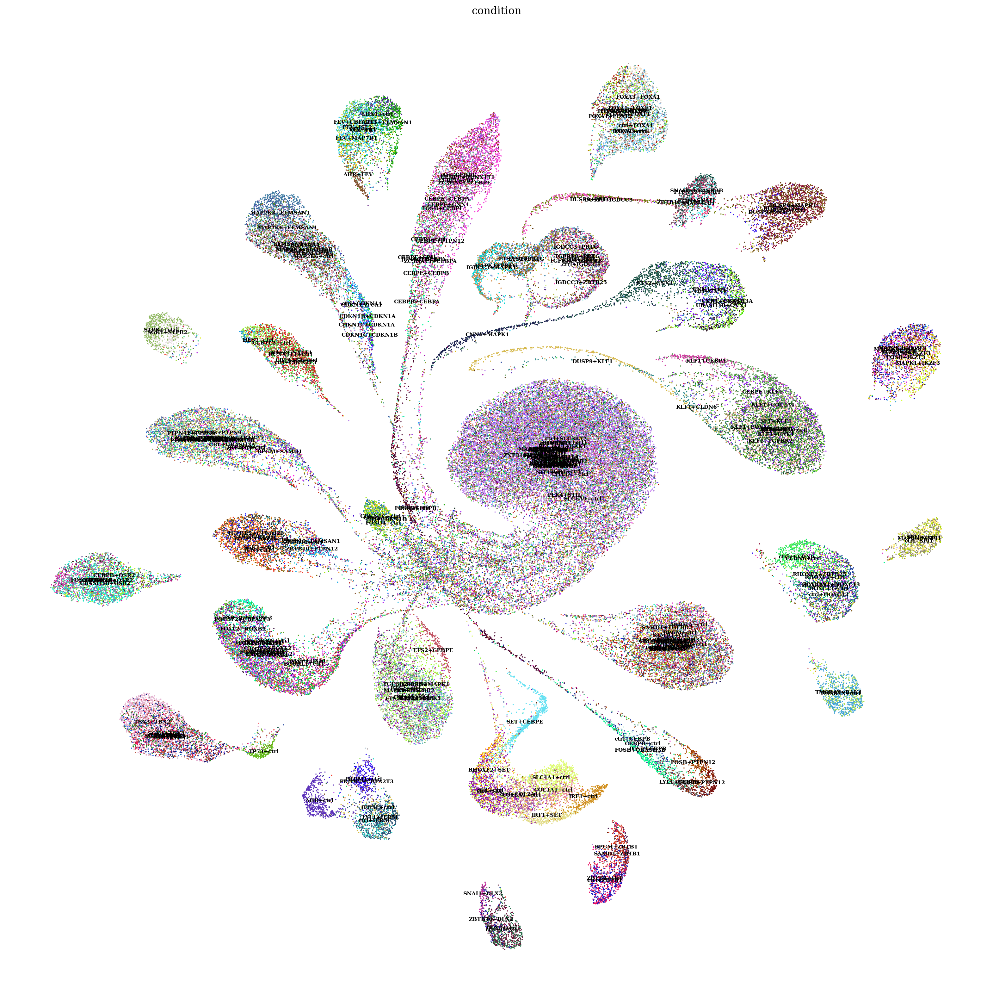

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

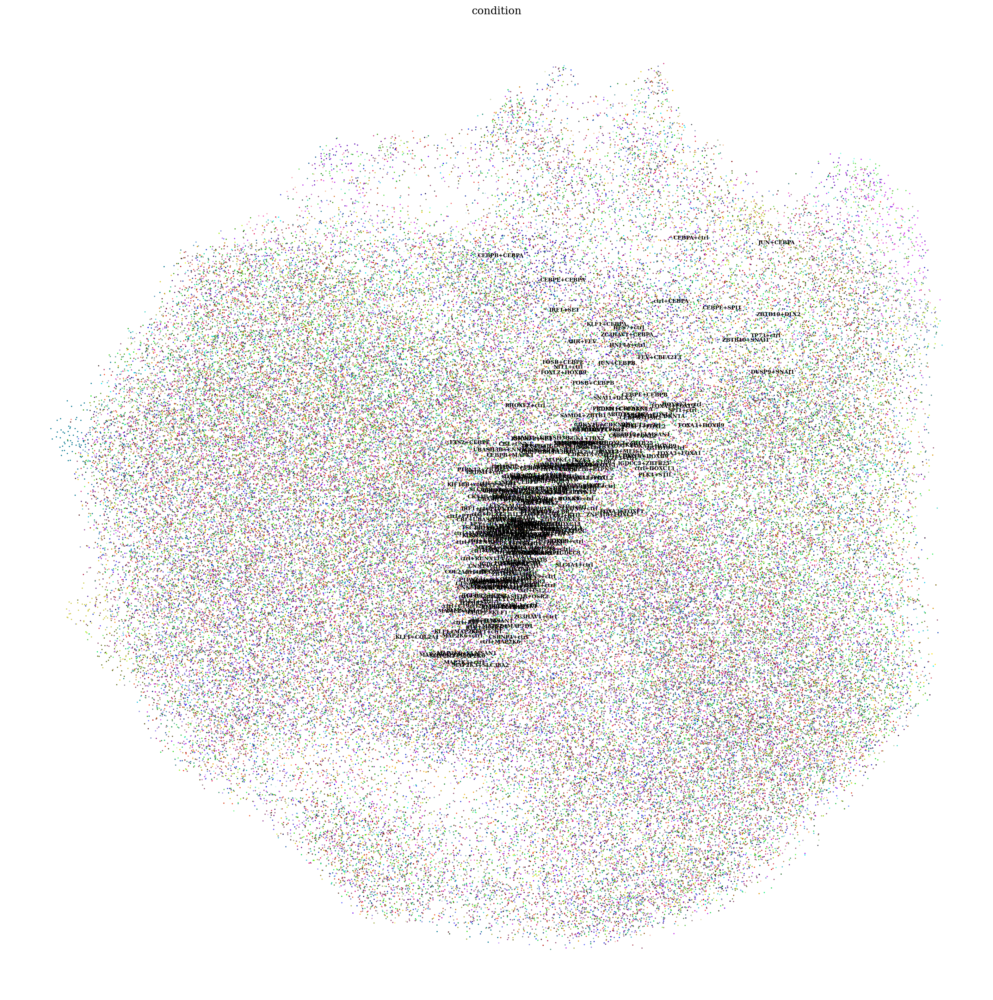

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()